<a id='importing'></a>

# **Importing and initialize options**

- Importing

In [119]:
import pandas as pd
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

- Display options

In [120]:
pd.options.display.max_rows=1000
pd.options.display.max_columns=1000

In [121]:
np.set_printoptions(threshold=np.inf)
pd.options.display.max_colwidth = 1000

# **Loading the csv files**
**And link to the relative Jupyter notebook**

All the csv files have been created previously in other jupyter pages. The description of the dataset is in the README file.
To see the notebook pages where I created the csv click on the hyperlink.

- LEFT

In [122]:
left_train = pd.read_csv('./DataBase/1_Left/goodreads/L_train_clean.csv')
left_test = pd.read_csv('./DataBase/1_Left/goodreads/L_test_clean.csv')

[Left scraping / cleaning](DataBase/1_Left/goodreads/quotes_left.ipynb#Left-Scraping-and-cleaning)
                           

- PROGRESSIVE

In [123]:
centre_left_train = pd.read_csv('./DataBase/2_Centre_Left/goodreads/CL_train_clean.csv')
centre_left_test = pd.read_csv('./DataBase/2_Centre_Left/goodreads/CL_test_clean.csv')

[Centre Left scraping / cleaning](DataBase/2_Centre_Left/goodreads/quotes_centre_left.ipynb#Centre-Left-Scraping-and-cleaning)

- MODERATE

In [124]:
centre_train = pd.read_csv('./DataBase/3_Centre/goodreads/C_train_clean.csv')
centre_test = pd.read_csv('./DataBase/3_Centre/goodreads/C_test_clean.csv')

[Centre scraping / cleaning](DataBase/3_Centre/goodreads/quotes_centre.ipynb#Centre-Scraping-and-cleaning)

- CONSERVATIVE

In [125]:
centre_right_train = pd.read_csv('./DataBase/4_Centre_Right/goodreads/CR_train_clean.csv')
centre_right_test = pd.read_csv('./DataBase/4_Centre_Right/goodreads/CR_test_clean.csv')

[Centre Right scraping / cleaning](DataBase/4_Centre_Right/goodreads/quotes_centre_right.ipynb#Centre-Right-Scraping-and-cleaning)

- RIGHT

In [126]:
right_train = pd.read_csv('./DataBase/5_Right/goodreads/R_train_clean.csv')
right_test = pd.read_csv('./DataBase/5_Right/goodreads/R_test_clean.csv')

[Right scraping / cleaning](DataBase/5_Right/goodreads/quotes_right.ipynb#Right-Scraping-and-cleaning)

# EDA and Pre-Processing

<a id='EDA-Preprocessing-Lemmatization'></a>

## EDA part 1

- Removing any other columns we don't need. 

In [127]:
def remove_unn(df):
    predictors = ['Author', 'Quotes', 'Political Orientation']
    for col in df.columns:
        if col not in predictors: 
            df=df.drop(col, axis=1)
        else:
            pass
    return df

In [128]:
left_train=remove_unn(left_train)
left_test=remove_unn(left_test)

centre_left_train=remove_unn(centre_left_train)
centre_left_test=remove_unn(centre_left_test)

centre_train=remove_unn(centre_train)
centre_test=remove_unn(centre_test)

centre_right_train=remove_unn(centre_right_train)
centre_right_test=remove_unn(centre_right_test)

right_train=remove_unn(right_train)
right_test=remove_unn(right_test)

## Putting all together

Joining the five different databse vertically

In [129]:
politic_train = pd.concat([left_train,centre_left_train, centre_train, centre_right_train, right_train])
politic_test = pd.concat([left_test,centre_left_test, centre_test, centre_right_test, right_test])

- Quick overview of the dataset

In [130]:
politic_train.head()

,Author,Political Orientation,Quotes
0,Yanis Varoufakis,Left,"Had history been democratic in its ways, there would have been no farming and no industrial revolution. Both leaps into the future were occasioned by unbearably painful crises that made most people wish they could recoil into the past."
1,Yanis Varoufakis,Left,"Most politicians cannot be theorists. First, because they are rarely thinkers; second, because the frenetic lifestyle they impose on themselves leaves no time for big ideas. But most of all because to be a theorist you have to admit the possibility of being wrong – the provisionality of knowledge – and you know you cannot spin your way out of a theoretical problem."
2,Yanis Varoufakis,Left,"Regular crises perpetuate the past by reinvigorating cycles which started long ago. In contrast, (capital-C) Crises are the past's death knell. They function like laboratories in which the future is incubated. They have given us agriculture and the industrial revolution, technology and the labour contract, killer germs and antibiotics. Once they strike, the past ceases to be a reliable predictor of the future and a brave new world is born."
3,Yanis Varoufakis,Left,"As Tony Benn, the British Labour politician, once suggested, we should constantly ask those who govern us five questions: What power have you got? Where did you get it from? In whose interests do you exercise it? To whom are you accountable? And how can we get rid of you?"
4,Yanis Varoufakis,Left,"... toxic derivatives were underpinned by toxic economics, which, in turn, were no more than motivated delusions in search of theoretical justification; fundamentalist tracts that acknowledged facts only when they could be accommodated to the demands of the lucrative faith. Despite their highly impressive labels and technical appearance, economic models were merely mathematized versions of the touching superstition that markets know best, both at times of tranquility and in periods of tumult."


## EDA part 2

- Changing our categorical string variable in numerical categorical variable:

0 --> Left

1 --> Progressive

2 --> Moderate

3 --> Conservative

4 --> Right

This will be usefull to keep the probability in the right order

In [131]:
penta_map = {'Left': 0, 'Progressive': 1, 'Moderate': 2, 'Conservative': 3, 'Right':4}

In [132]:
#Train
politic_train['Penta_target'] = politic_train['Political Orientation'].map(penta_map)

#Test
politic_test['Penta_target'] = politic_test['Political Orientation'].map(penta_map)


In [133]:
politic_train.head()

,Author,Political Orientation,Quotes,Penta_target
0,Yanis Varoufakis,Left,"Had history been democratic in its ways, there would have been no farming and no industrial revolution. Both leaps into the future were occasioned by unbearably painful crises that made most people wish they could recoil into the past.",0
1,Yanis Varoufakis,Left,"Most politicians cannot be theorists. First, because they are rarely thinkers; second, because the frenetic lifestyle they impose on themselves leaves no time for big ideas. But most of all because to be a theorist you have to admit the possibility of being wrong – the provisionality of knowledge – and you know you cannot spin your way out of a theoretical problem.",0
2,Yanis Varoufakis,Left,"Regular crises perpetuate the past by reinvigorating cycles which started long ago. In contrast, (capital-C) Crises are the past's death knell. They function like laboratories in which the future is incubated. They have given us agriculture and the industrial revolution, technology and the labour contract, killer germs and antibiotics. Once they strike, the past ceases to be a reliable predictor of the future and a brave new world is born.",0
3,Yanis Varoufakis,Left,"As Tony Benn, the British Labour politician, once suggested, we should constantly ask those who govern us five questions: What power have you got? Where did you get it from? In whose interests do you exercise it? To whom are you accountable? And how can we get rid of you?",0
4,Yanis Varoufakis,Left,"... toxic derivatives were underpinned by toxic economics, which, in turn, were no more than motivated delusions in search of theoretical justification; fundamentalist tracts that acknowledged facts only when they could be accommodated to the demands of the lucrative faith. Despite their highly impressive labels and technical appearance, economic models were merely mathematized versions of the touching superstition that markets know best, both at times of tranquility and in periods of tumult.",0


In [134]:
politic_train.tail()

,Author,Political Orientation,Quotes,Penta_target
2225,Dinesh D'Souza,Right,"The American slave was treated like property, which is to say, pretty well.",4
2226,Dinesh D'Souza,Right,"Strictly speaking, relativism does not permit social progress, because the new culture is by definition no better than the one it replaced.",4
2227,Dinesh D'Souza,Right,It is understandable but implausible...to insist upon prominent media accounts about law-abiding citizens and quotidian virtue; this is a bit like the airline industry complaining that the press does not write stories about airplanes that land safely.,4
2228,Dinesh D'Souza,Right,Black rage is largely a response not to white racism but to black failure.,4
2229,Dinesh D'Souza,Right,"If biological differences do exist, they cannot be wished away. However unpopular the investigation, we have to take the possibility of natural differences seriously. What is at stake is nothing less than the foundation of contemporary liberalism.",4


In [135]:
politic_train.shape

(11204, 4)

In [136]:
politic_test.head()

,Author,Political Orientation,Quotes,Penta_target
0,Raymond Williams,Left,"[T]here are in fact no masses, but only ways of seeing people as masses.",0
1,Raymond Williams,Left,"It is the definition of an egoist that whatever occupies his attention is, for that reason, important.",0
2,Raymond Williams,Left,"From the late eighteenth century onwards, it is no longer from the practice of community but from being a wanderer that the instinct of fellow-feeling is derived. Thus an essential isolation and silence and loneliness become the carriers of nature and community against the rigours, the cold abstinence, the selfish ease of ordinary society.",0
3,Raymond Williams,Left,"There was, however, a difference between his mood and that of the rest of the cabinet. They felt desperate; he felt challenged.",0
4,Raymond Williams,Left,"If Gissing is less compassionately observant than Mrs Gaskell, less overtly polemical than Kingsley, still The Nether World and Demos would be sympathetically endorsed by either of them, or by their typical readers. Yet Gissing does introduce an important new element, and one that remains significant. He has often been called ‘the spokesman of despair,’ and this is true in both meanings of the phrase. Like Kingsley and Mrs Gaskell, he writes to describe the true conditions of the poor, and to protest against those brute forces of society which fill with wreck the abysses of the nether world. Yet he is also the spokesman of another kind of despair: the despair born of social and political disillusion. In this he is a figure exactly like Orwell in our own day, and for much the same reason. Whether one calls this honesty or not will depend on experience.",0


In [137]:
politic_test.tail()

,Author,Political Orientation,Quotes,Penta_target
84,Augustus Sol Invictus,Right,"We now enter a new age of American history, and the question to be answered is this: Will we restore the republic our forefathers created, or will we allow it to be annihilated by those who hate America, its history, and all it stands for?",4
85,Augustus Sol Invictus,Right,"It has been said that I am not a 'real' Libertarian. A certain faction of the Party has come to believe that the writings of Ayn Rand and Milton Friedman are the holy texts of Libertarianism, and I disagree. I believe that the Libertarian movement is and should be more encompassing than the narrow-minded advocacy of economic anarchy.",4
86,Augustus Sol Invictus,Right,"I don't think I'm the only person who sees a cataclysm coming, but I think I'm the only person saying it, and I think that scares people.",4
87,Augustus Sol Invictus,Right,My accent really comes out when I'm speaking in public or when I'm passionate about something.,4
88,Augustus Sol Invictus,Right,Ninety-nine percent of the things that seem weird in my life can be answered with my religion. Paganism is mostly about nature-worship. It's about being in harmony with your environment and bringing the world of spirit and world of man together. It's about balance.,4


In [138]:
politic_test.shape

(472, 4)

## Checking for missing values

- Function who find and print raw with missing values

In [139]:
nans = lambda df: df[df.isnull().any(axis=1)]

In [140]:
nans(politic_train)

,Author,Political Orientation,Quotes,Penta_target


In [141]:
nans(politic_test)

,Author,Political Orientation,Quotes,Penta_target


- No missing value are present

## EDA part 3 - Pre-Processing

In [142]:
from textacy.preprocess import preprocess_text
import re

- Since the data are already pretty clean from the scraping page, the main goal from textacy is to remove punctuation, special charachter, accent and transform everything lowercase.

- After I am removing all the number, as I don't think are important to our purpose

In [143]:
politic_train['textacy'] = politic_train.Quotes.apply(lambda x : preprocess_text(x, fix_unicode=True, lowercase=True, 
                                                            transliterate=True,no_urls=True, 
                                                            no_emails=True, no_phone_numbers=True, 
                                                            no_currency_symbols=True, no_punct=True, 
                                                            no_accents=True, no_contractions=True))

politic_test['textacy'] = politic_test.Quotes.apply(lambda x : preprocess_text(x, fix_unicode=True, lowercase=True, 
                                                            transliterate=True,no_urls=True, 
                                                            no_emails=True, no_phone_numbers=True, 
                                                            no_currency_symbols=True, no_punct=True, 
                                                            no_accents=True, no_contractions=True))


In [144]:
politic_train['textacy'] = politic_train['textacy'].str.replace('\d+','')
politic_test['textacy'] = politic_test['textacy'].str.replace('\d+','')

- Tokenize

Tokenize the quotes to count the words and applying the 

In [145]:
from nltk.tokenize import RegexpTokenizer
import nltk
from nltk.stem import WordNetLemmatizer

In [146]:
tokenizer = RegexpTokenizer(r'\w+')

In [147]:
politic_train['tokens'] = politic_train['textacy'].apply(tokenizer.tokenize)
politic_test['tokens'] = politic_test['textacy'].apply(tokenizer.tokenize)


- Creating a column with number of words for  quote

In [148]:
politic_train['n_words'] = politic_train.tokens.apply(lambda x : len(x))
politic_test['n_words'] = politic_test.tokens.apply(lambda x : len(x))

- Removing all the quotes with less than 8 words.

Usually an english sentence is made with 10 words. Since we have already removed some of them in the tokenization, 8 seems to be a fair good number. 
A very short sentence sometimes doesn't bring any meaning.
Some of the quotes are also very long and removing them is a way to rebalanced a bit

In [149]:
politic_train = politic_train[politic_train.n_words > 8]
politic_test = politic_test[politic_test.n_words > 8]

In [150]:
lemmatizer = WordNetLemmatizer()

In [151]:
politic_train['textacy'] = politic_train.tokens.apply(lambda x : ' '.join([lemmatizer.lemmatize(w) for w in x]))
politic_test['textacy'] = politic_test.tokens.apply(lambda x : ' '.join([lemmatizer.lemmatize(w) for w in x]))


# **Creating Balance classes and checking the Baseline**

<a id='Baseline-Classes'></a>

- I have a different number of quotes from each class. I will create a balanced classes taking random number of sample like the number of the smallest category ( Progressive ).

In [152]:
penta_minim = politic_train['Penta_target'].value_counts().values.min()
penta_minim

1616

In [153]:
penta_train = politic_train.groupby('Penta_target').apply(lambda x: x.sample(penta_minim))
penta_test = politic_test.copy()

- Checking my Baseline

In [154]:
penta_train.Penta_target.value_counts(normalize=True)

3    0.2
2    0.2
1    0.2
4    0.2
0    0.2
Name: Penta_target, dtype: float64

# Inspecting Vocabulary

<a id='Vocabulary'></a>

- Before to start to modelling, is very important know even better your Dataset. How many words each category has, how long is the average quote, how long is the longest one, and the median number of words in a quote.

In [155]:
diz_n_words = {}
for category in penta_train['Penta_target'].unique():
    print('\033[1m', '--', category,'--','Train','--', '\033[0m')
    print('Total number of words: ', penta_train[penta_train['Penta_target']==category]['n_words'].sum())
    print('Max quote length: ', penta_train[penta_train['Penta_target']==category]['n_words'].max())
    print('Average quote length: ', round(penta_train[penta_train['Penta_target']==category]['n_words'].mean(), 2))
    print('Median of quote: ', penta_train[penta_train['Penta_target']==category]['n_words'].median())
    print()
    print('\033[1m', '--', category,'--','Test','--', '\033[0m')
    print('Total number of words: ', penta_test[penta_test['Penta_target']==category]['n_words'].sum())
    print('Max quote length: ', penta_test[penta_test['Penta_target']==category]['n_words'].max())
    print('Average quote length: ', round(penta_test[penta_test['Penta_target']==category]['n_words'].mean(), 2))
    print('Median of quote: ', penta_test[penta_test['Penta_target']==category]['n_words'].median())
    print()
    print()

    diz_n_words[category] = penta_train[penta_train['Penta_target']==category]['n_words'].sum()

 -- 0 -- Train -- 
Total number of words:  109418
Max quote length:  743
Average quote length:  67.71
Median of quote:  48.0

 -- 0 -- Test -- 
Total number of words:  5512
Max quote length:  223
Average quote length:  59.91
Median of quote:  43.0


 -- 1 -- Train -- 
Total number of words:  89137
Max quote length:  613
Average quote length:  55.16
Median of quote:  39.0

 -- 1 -- Test -- 
Total number of words:  2817
Max quote length:  72
Average quote length:  31.65
Median of quote:  31.0


 -- 2 -- Train -- 
Total number of words:  77069
Max quote length:  600
Average quote length:  47.69
Median of quote:  33.5

 -- 2 -- Test -- 
Total number of words:  3900
Max quote length:  138
Average quote length:  34.82
Median of quote:  25.0


 -- 3 -- Train -- 
Total number of words:  85872
Max quote length:  365
Average quote length:  53.14
Median of quote:  38.0

 -- 3 -- Test -- 
Total number of words:  3495
Max quote length:  231
Average quote length:  44.24
Median of quote:  33.0


 -- 

- The Left and Right have more words, mean and median higher. Moderate is the last one.

In [156]:
penta_train.reset_index(level=0, drop=True, inplace=True)

# **Bag of words**

- Bag of words is a simply way to to represent the words in NLP. It consists to create a matrix-vocabulary with all the words present in our corpus.

In [157]:
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from wordcloud import WordCloud
from sklearn.feature_extraction import text 

- There are some words that are very common and are completely useless. All the auxiliary verbs for example, and words very common in a quote vocabulary, like or said for example.

In [158]:
extra_words = ['wa', 'ha', 'did', 'does', 'do', 'just','doe', 'say', 'want', 'said', 'like']
stops = text.ENGLISH_STOP_WORDS.union(list(extra_words))

In [159]:
def bag_word(df, cl, n_g, col, n_print):
    
    
    vect = CountVectorizer(stop_words=stops, ngram_range=(n_g,n_g+1))
    words = {}
    voc = df[df['Penta_target']==cl]
    Str_Voc = ''.join(voc[col])
    voc_n_grams = vect.build_analyzer()(Str_Voc)
    words[cl] = Counter(voc_n_grams).most_common()
    print('Classe: ', cl)
    print('Number of gram: ', n_g)
    w = []
    tup = []
    for element in Counter(voc_n_grams).most_common(n_print) :
        print(element)
        w.append(element[0])
        tup.append(element)
    print()
    print()
    #show_wordcloud(w)
    return w, tup

In [160]:
left_counts, left_tuple = bag_word(penta_train, 0, 1, 'textacy', 30)
centre_left_counts, centre_left_tuple = bag_word(penta_train, 1, 1, 'textacy', 30)
centre_counts, centre_tuple = bag_word(penta_train, 2, 1,'textacy', 30)
centre_right_counts, centre_right_tuple = bag_word(penta_train, 3, 1, 'textacy', 30)
right_counts, right_tuple = bag_word(penta_train, 4, 1,'textacy', 30)



Classe:  0
Number of gram:  1
('people', 367)
('world', 268)
('state', 245)
('human', 229)
('war', 192)
('time', 185)
('way', 180)
('life', 179)
('new', 166)
('right', 148)
('society', 142)
('history', 141)
('thing', 139)
('power', 139)
('make', 138)
('government', 137)
('know', 137)
('think', 134)
('mean', 131)
('year', 129)
('social', 119)
('political', 117)
('work', 116)
('need', 116)
('country', 114)
('woman', 109)
('american', 108)
('fact', 106)
('kind', 103)
('economic', 103)


Classe:  1
Number of gram:  1
('people', 302)
('state', 191)
('world', 170)
('time', 169)
('government', 160)
('right', 141)
('life', 140)
('way', 128)
('know', 127)
('thing', 127)
('country', 127)
('new', 126)
('political', 124)
('economic', 123)
('idea', 120)
('make', 120)
('society', 119)
('public', 117)
('good', 116)
('year', 115)
('market', 114)
('american', 109)
('social', 106)
('think', 101)
('work', 100)
('need', 97)
('power', 96)
('policy', 95)
('free', 89)
('law', 86)


Classe:  2
Number of gram:

In [161]:
number_words = pd.DataFrame({'Left': left_tuple,
                             'Progressive': centre_left_tuple,
                             'Moderate': centre_tuple,
                             'Conservative': centre_right_tuple,
                             'Right': right_tuple})

- Top 30 words, with the counter by category

<a id='top-30-words'></a>

In [162]:
number_words

,Left,Progressive,Moderate,Conservative,Right
0,"(people, 367)","(people, 302)","(people, 373)","(people, 364)","(people, 455)"
1,"(world, 268)","(state, 191)","(world, 236)","(government, 228)","(state, 232)"
2,"(state, 245)","(world, 170)","(make, 173)","(life, 151)","(american, 196)"
3,"(human, 229)","(time, 169)","(time, 159)","(american, 146)","(world, 191)"
4,"(war, 192)","(government, 160)","(thing, 155)","(know, 146)","(america, 191)"
5,"(time, 185)","(right, 141)","(life, 153)","(make, 145)","(white, 180)"
6,"(way, 180)","(life, 140)","(moral, 145)","(right, 140)","(right, 171)"
7,"(life, 179)","(way, 128)","(way, 144)","(state, 138)","(black, 165)"
8,"(new, 166)","(know, 127)","(work, 130)","(time, 137)","(government, 162)"
9,"(right, 148)","(thing, 127)","(good, 129)","(thing, 130)","(war, 160)"


We can notice a lot of similarity between the classes

- For the external dataset

In [163]:
left_test, left_tuple_test = bag_word(penta_test, 0, 1, 'textacy', 30)
centre_left_test, centre_left_tuple_test = bag_word(penta_test, 1, 1, 'textacy', 30)
centre_counts_test, centre_tuple_test = bag_word(penta_test, 2, 1,'textacy', 30)
centre_right_test, centre_right_tuple_test = bag_word(penta_test, 3, 1, 'textacy', 30)
right_test, right_tuple_test = bag_word(penta_test, 4, 1,'textacy', 30)


Classe:  0
Number of gram:  1
('world', 19)
('power', 19)
('political', 17)
('society', 15)
('life', 14)
('social', 13)
('state', 12)
('capitalism', 12)
('economic', 11)
('scream', 11)
('history', 8)
('time', 8)
('hegel', 8)
('new', 7)
('work', 7)
('idea', 7)
('theory', 7)
('theoretical', 7)
('europe', 7)
('present', 7)
('struggle', 7)
('way', 6)
('people', 6)
('class', 6)
('different', 6)
('subject', 6)
('range', 6)
('mean', 6)
('fact', 5)
('reason', 5)


Classe:  1
Number of gram:  1
('government', 13)
('people', 13)
('america', 12)
('make', 9)
('public', 8)
('world', 8)
('time', 8)
('way', 7)
('private', 7)
('business', 7)
('job', 7)
('really', 6)
('thing', 6)
('work', 5)
('change', 5)
('country', 5)
('school', 5)
('better', 5)
('state', 5)
('think', 5)
('life', 5)
('happiness', 5)
('free', 4)
('share', 4)
('hard', 4)
('economy', 4)
('income', 4)
('religion', 4)
('politics', 4)
('reason', 4)


Classe:  2
Number of gram:  1
('american', 26)
('think', 18)
('power', 16)
('financial', 1

In [164]:
number_words_test = pd.DataFrame({'Left': left_tuple_test,
                             'Progressive': centre_left_tuple_test,
                             'Moderate': centre_tuple_test,
                             'Conservative': centre_right_tuple_test,
                             'Right': right_tuple_test})

- Top 30 words in the external test dataframe

In [165]:
number_words_test

,Left,Progressive,Moderate,Conservative,Right
0,"(world, 19)","(government, 13)","(american, 26)","(people, 17)","(think, 18)"
1,"(power, 19)","(people, 13)","(think, 18)","(way, 13)","(people, 17)"
2,"(political, 17)","(america, 12)","(power, 16)","(think, 12)","(country, 16)"
3,"(society, 15)","(make, 9)","(financial, 16)","(country, 12)","(medium, 15)"
4,"(life, 14)","(public, 8)","(world, 13)","(know, 11)","(going, 12)"
5,"(social, 13)","(world, 8)","(europe, 13)","(keynesian, 11)","(opposed, 9)"
6,"(state, 12)","(time, 8)","(state, 13)","(power, 10)","(believe, 8)"
7,"(capitalism, 12)","(way, 7)","(economic, 12)","(love, 8)","(world, 7)"
8,"(economic, 11)","(private, 7)","(policy, 11)","(society, 8)","(political, 7)"
9,"(scream, 11)","(business, 7)","(united, 11)","(rate, 7)","(nation, 6)"


Some of the main words in the train dataset are present also in the test dataset

# Modelling with CountVectorizer

<a id='count-vectorizer'></a>

- CountVectorizer is a Bag of word tool from scikit-learn. It is based on the frequency of the words. I am expecting many words we saw in the precious analysis be present in the modelling.

In [166]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, TfidfTransformer
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction import text 

In [167]:
X_train, X_test, y_train, y_test = train_test_split(penta_train, 
                                                    penta_train.Penta_target, 
                                                    stratify=penta_train.Penta_target,
                                                    test_size = 0.3,
                                                    random_state = 1)

## Logistic Regression

- Logistic Regression is always the first model to try. It is easy to use, most of the time works pretty well, and give us the coefficient that make you understand better how your model is working

In [168]:
logic_bag = Pipeline([
    ('vect', CountVectorizer(stop_words=stops, ngram_range=(1,3))),
    ('log', LogisticRegression())])

In [169]:
logic_bag.fit(X_train.textacy, y_train)

Pipeline(memory=None,
     steps=[('vect', CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 3), preprocessor=None,
        stop_words=frozenset({...penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False))])

In [170]:
logic_bag.score(X_test.textacy, y_test)

0.47813531353135313

- Consusion Matrix

- In a classification model never look at the score without evaluating. Confusion matrix and classification report help you to have a very nice overview of your model behavior.

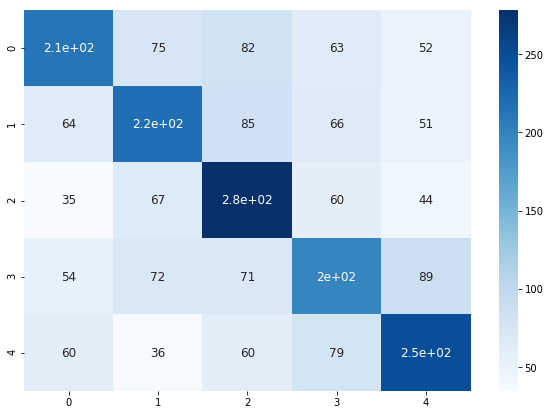

In [171]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_test, logic_bag.predict(X_test.textacy))), annot=True,annot_kws={"size": 12}, cmap="Blues")

- Classification Report

In [172]:
print(classification_report(y_test, logic_bag.predict(X_test.textacy)))

              precision    recall  f1-score   support

           0       0.50      0.44      0.47       485
           1       0.47      0.45      0.46       485
           2       0.48      0.57      0.52       484
           3       0.43      0.41      0.42       485
           4       0.51      0.52      0.51       485

   micro avg       0.48      0.48      0.48      2424
   macro avg       0.48      0.48      0.48      2424
weighted avg       0.48      0.48      0.48      2424



- Class 3 (Conservative) is our weakest category with low precision and low recall. From the hetmap confusion matrix we can see very well the diagonal of true values and shading away mostly in a linear way (except for conservative). In and ordinal classification problem like this one, check that the mistake are not that far from the true value is important to understand our model.

###  Important words for Logistic Regression

- The coefficients are the most important aspect to understand the Logistic Regression model. On the left there are the top coefficient and on the right the worst, for each category. In our case the coefficients are the words, or features, that make our model make the choice.

#### Functions

In [173]:
def get_important_words(vectorizer, model, nn):
    '''Function that return a dictionary with each class and their important features, best and worst'''
    ind_word = {v:k for k,v in vectorizer.vocabulary_.items()}
    
    # loop for each class
    classes ={}
    for class_index in range(model.coef_.shape[0]):
        word_importances = [(element, ind_word[i]) for i,element in enumerate(model.coef_[class_index])]
        sorted_coeff = sorted(word_importances, key = lambda x : x[0], reverse=True)
        tops = sorted(sorted_coeff[:nn], key = lambda x : x[0], reverse=True)
        bottom = sorted_coeff[-nn:]
        classes[class_index] = {
            'tops':tops,
            'bottom':bottom
        }
    return classes

In [174]:
def plot_words(dic, category):
    '''Return 2 plot for the best and the worst coefficient of each category'''
    diz_classi = {0:'Left', 1:'Progressive', 2:'Moderate', 3:'Conservative', 4:'Right'}
#    n_class = len(dic.keys())
    list_top = []
    y_top = []
    list_down = []
    y_down = []
    for i in range(20):
        list_top.append(dic[category]['tops'][i][1])
        y_top.append(dic[category]['tops'][i][0])
        list_down.append(dic[category]['bottom'][i][1])
        y_down.append(dic[category]['bottom'][i][0])
            
    list_top.reverse()
    y_top.reverse()

    color_diz = {0: ['red', 'black'], 1:['green', 'blue'], 2:['yellow', 'red'], 3:['blue', 'red'], 4:['black', 'red']}
    fig = plt.figure(figsize=(40, 30)) 
    
    plt.subplot(121)
    plt.barh(list_top,y_top, alpha=0.5, color=color_diz[category][0])
    plt.title(diz_classi[category]+' top', fontsize=50)
    plt.yticks(fontsize=35)

    
    plt.subplot(122)
    plt.barh(list_down,y_down, alpha=0.5, color=color_diz[category][1])
    plt.title(diz_classi[category]+' bottom', fontsize=50)
    plt.yticks(fontsize=35)


#### Best and worst words for the Lefts

In [175]:
importance = get_important_words(logic_bag.steps[0][1], logic_bag.steps[1][1], 20)

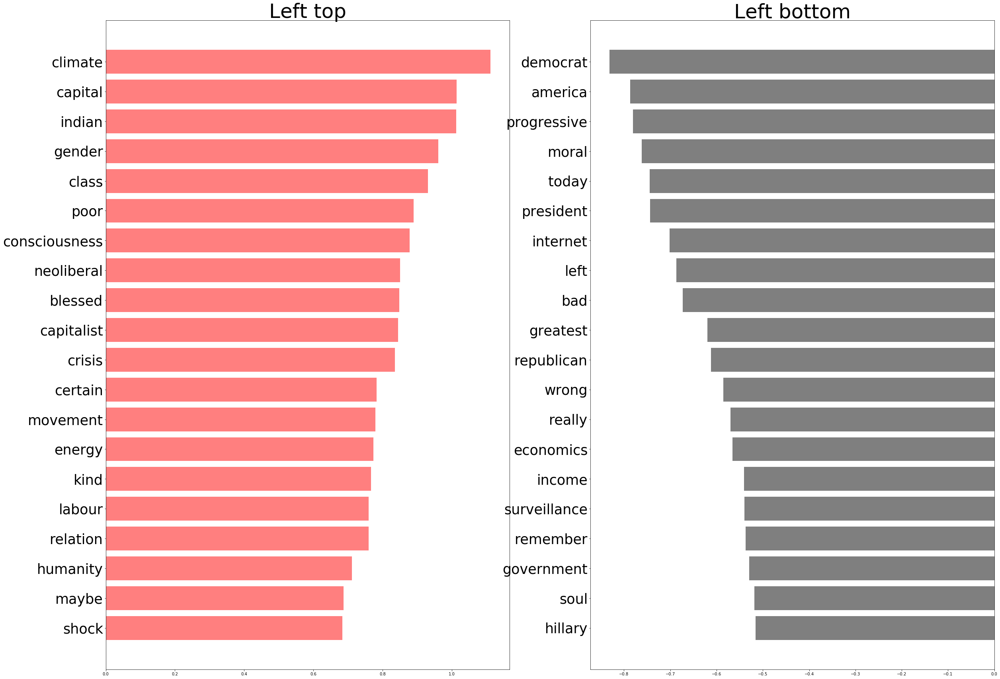

In [176]:
plot_words(importance, 0)

####  Best and worst word for the Progressive

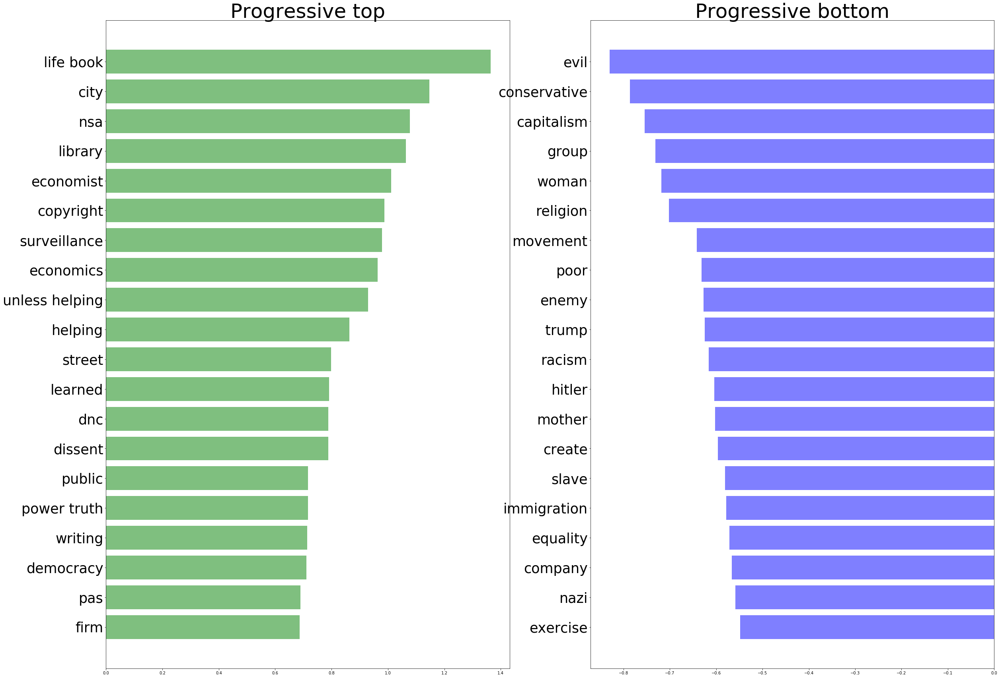

In [177]:
plot_words(importance, 1)

####  Best and worst words for the Moderate

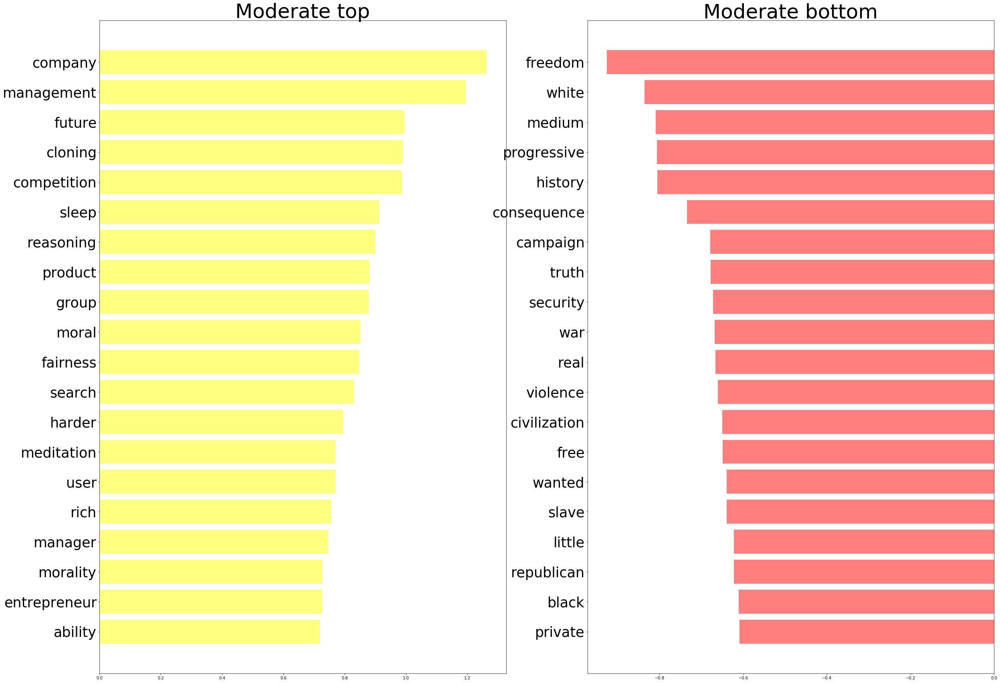

In [178]:
plot_words(importance, 2)

#### Best and worst words for the Conservative

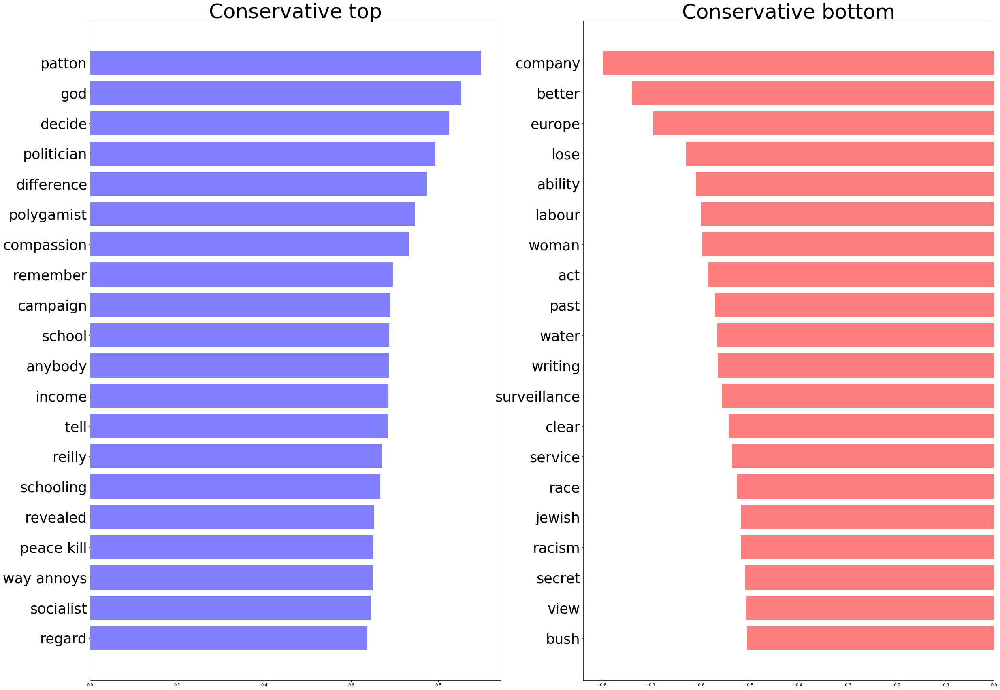

In [179]:
plot_words(importance, 3)

#### Best and worst words for the Right

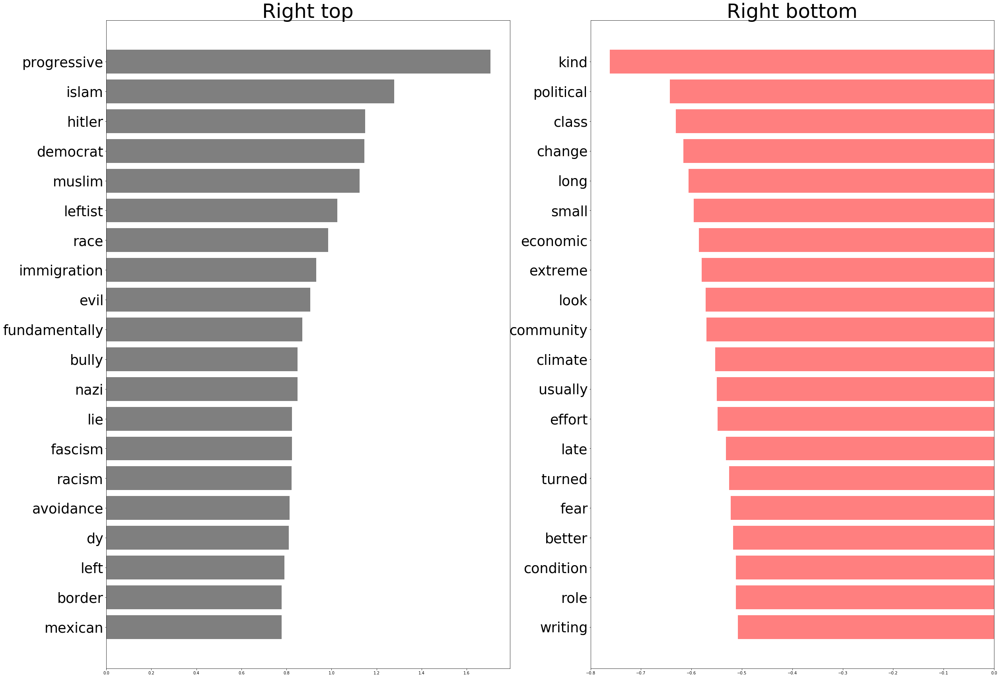

In [180]:
plot_words(importance, 4)

## Modelling with other classifier

- We will try other classifiers to check their behavior in the score and we will select the best one.

In [181]:
models = [('dt',DecisionTreeClassifier()), 
          ('nb', MultinomialNB()), 
          ('svm', SVC(kernel='linear')), 
          ('knn', KNeighborsClassifier()), 
          ('rf', RandomForestClassifier()),
          ('nbb', BernoulliNB())]

In [182]:
for model in models:
    classifier_bag = Pipeline([
    ('vect', CountVectorizer(stop_words=stops, ngram_range=(1,3))),
    (model)])
    print(model[1])
    classifier_bag.fit(X_train.textacy, y_train)
    print(classifier_bag.score(X_test.textacy, y_test))
    print()
    print()

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.35973597359735976


MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
0.48556105610561057


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)
0.4298679867986799


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')
0.19884488448844884


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=

- Most of them have a very poor score, so they are probably not that useful. Vector machine and MultinomialNB have the best score. Both are two popular choices in text classification. 

## Investigating MultinomialNB

- Multinomial Naive Bayes is a kind of black box. Given a class it estimates the conditional probability of a particular word (with frequency or weight) in the corpus to belongin to that particular class. It is probably the most popular choice in text classification in machine learning.


In [183]:
multi_nb= Pipeline([
    ('vect', CountVectorizer(stop_words=stops, ngram_range=(1,3))),
    ('model',MultinomialNB(0.3))])

In [184]:
multi_nb.fit(X_train.textacy, y_train)

Pipeline(memory=None,
     steps=[('vect', CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 3), preprocessor=None,
        stop_words=frozenset({...izer=None, vocabulary=None)), ('model', MultinomialNB(alpha=0.3, class_prior=None, fit_prior=True))])

In [185]:
multi_nb.score(X_test.textacy, y_test)

0.5057755775577558

- Confusion Matrix and Correlation report for this classifier

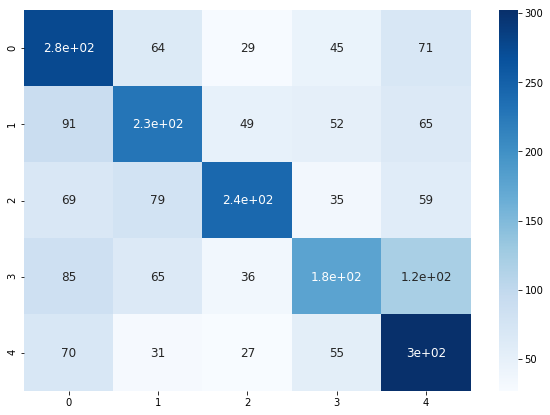

In [186]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_test, multi_nb.predict(X_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [187]:
print(classification_report(y_test, multi_nb.predict(X_test.textacy)))

              precision    recall  f1-score   support

           0       0.47      0.57      0.51       485
           1       0.49      0.47      0.48       485
           2       0.63      0.50      0.56       484
           3       0.49      0.37      0.42       485
           4       0.49      0.62      0.55       485

   micro avg       0.51      0.51      0.51      2424
   macro avg       0.51      0.51      0.50      2424
weighted avg       0.51      0.51      0.50      2424



- We have a strongest diagonal than before, with more true values. Especially the two extreme categories stand out. The recall for these 2 arrive to 60%. While the best precision is for Moderate. Conservative is still the worst category, in fact we have more false positive in the left. The model works better overall but this error (left-conservative) is less acceptable.

### Frequency of words from CountVectorizer

- Since we are using CountVectorizer and Multinomial Naive Bayes, we can check the most frequent words, which most likely they will be very similar to our analysis pre-modelling.

#### Features function

- 4 function to get the frequency of the words from this classifier

In [188]:
def top_feats(row, features, top_n=25):
    ''' Get top n tfidf values in row and return them with their corresponding feature names.'''
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    df = pd.DataFrame(top_feats)
    df.columns = ['feature', 'val']
    return df

In [189]:
def top_feats_in_doc(Xtr, features, row_id, top_n=25):

    row = np.squeeze(Xtr[row_id].toarray())
    return top_feats(row, features, top_n)

In [190]:
def top_mean_feats(Xtr, features, grp_ids=None, min_tfidf=0.1, top_n=25):
    
    if grp_ids:
        D = Xtr[grp_ids].toarray()
    else:
        D = Xtr.toarray()

    D[D < min_tfidf] = 0
    tfidf_means = np.mean(D, axis=0)
    return top_feats(tfidf_means, features, top_n)

In [191]:
def top_feats_by_class(Xtr, y, features, min_tfidf=0.1, top_n=25):
    ''' Return a list of dfs, where each df holds top_n features and their mean tfidf value
        calculated across documents with the same class label. '''
    dfs = []
    labels = np.unique(y)
    for label in labels:
        ids = np.where(y==label)
        feats_df = top_mean_feats(Xtr, features, ids, min_tfidf=min_tfidf, top_n=top_n)
        feats_df.label = label
        dfs.append(feats_df)
    return dfs

In [192]:
cvec = multi_nb.steps[0][1]

In [193]:
XTR = cvec.fit_transform(X_train.textacy)
featur = cvec.get_feature_names()

In [194]:
feat_bag = top_feats_by_class(XTR, y_train, featur)

In [195]:
feat_bag = pd.concat([feat_bag[0], feat_bag[1], feat_bag[2], feat_bag[3], feat_bag[4]], axis=1)

- Creating a dataframe with where in each column we have the classes and their words and next to them the frequency.

In [196]:
feat_bag.columns = ['Left','fr_left','Progressive','fr_progressive', 'Moderate', 'fr_moderate', 'Conservative', 'fr_conservative', 'Right', 'fr_right']

In [197]:
feat_bag

,Left,fr_left,Progressive,fr_progressive,Moderate,fr_moderate,Conservative,fr_conservative,Right,fr_right
0,people,0.210433,people,0.191866,people,0.220848,people,0.252874,people,0.306808
1,world,0.178603,state,0.129089,world,0.153710,government,0.144120,state,0.158267
2,state,0.159151,world,0.118479,life,0.120141,life,0.100796,american,0.135279
3,human,0.135279,time,0.112290,thing,0.106007,american,0.097259,world,0.122016
4,time,0.126437,government,0.103448,make,0.105124,make,0.097259,america,0.118479
5,life,0.121132,life,0.095491,moral,0.102473,right,0.096375,government,0.113174
6,way,0.110522,right,0.084881,time,0.098057,state,0.091954,right,0.112290
7,war,0.105217,thing,0.083112,work,0.094523,time,0.090186,black,0.101680
8,new,0.099027,know,0.083112,way,0.084806,know,0.086649,obama,0.098143
9,power,0.097259,make,0.080460,good,0.082155,thing,0.084881,way,0.097259


- We can visualize the top 10 for each cateogries

##### Frequency for the left

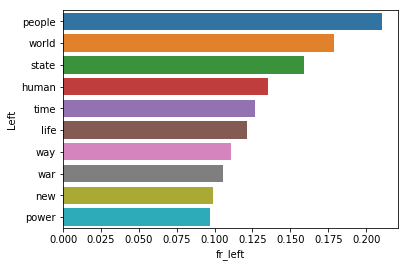

In [198]:
figsize=(30,10)
sns.barplot(x=feat_bag.iloc[:10,1], y=feat_bag.iloc[:10,0])

##### Frequency for the Progressive

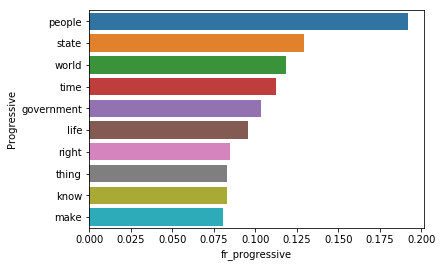

In [199]:
figsize=(30,10)
sns.barplot(x=feat_bag.iloc[:10,3], y=feat_bag.iloc[:10,2])

##### Frequency for the Moderate

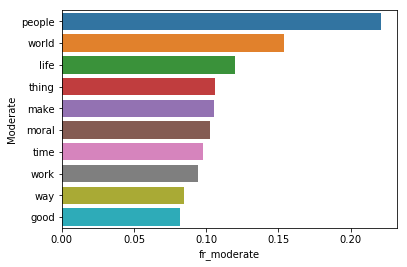

In [200]:
figsize=(30,10)
sns.barplot(x=feat_bag.iloc[:10,5], y=feat_bag.iloc[:10,4])

##### Frequency for the Conservative

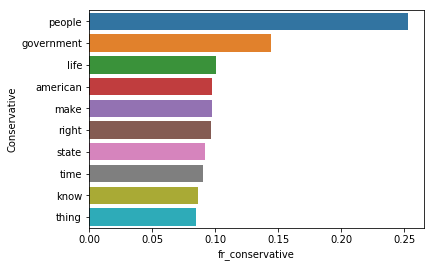

In [201]:
figsize=(30,10)
sns.barplot(x=feat_bag.iloc[:10,7], y=feat_bag.iloc[:10,6])

##### Frequency for the Conservative

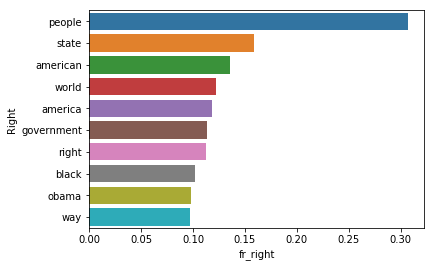

In [202]:
figsize=(30,10)
sns.barplot(x=feat_bag.iloc[:10,9], y=feat_bag.iloc[:10,8])

- Once again we notice a lot of similarity

### Mismatch

- Let's check what the classifier predict wrong

In [203]:
pred_multi_nb = multi_nb.predict(X_test.textacy)

# Incorrectly classified
incorrect_preds_multi_nb = X_test[(pred_multi_nb != X_test['Penta_target'])]
incorrect_preds_multi_nb = (pred_multi_nb != X_test['Penta_target'])

In [204]:
incorrect_multi_nb = pd.DataFrame({'actual': X_test['Penta_target'],
                                   'predicted': pred_multi_nb,
                                   'mismatch': incorrect_preds_multi_nb,
                                   'TEXT': X_test.Quotes,
                                   'Author': X_test.Author,
                                   'Processed text': X_test.textacy})

print(incorrect_multi_nb[incorrect_multi_nb.mismatch == True].shape)
incorrect_multi_nb[incorrect_multi_nb.mismatch == True]

(1198, 6)


,actual,predicted,mismatch,TEXT,Author,Processed text
566,1,3,True,To seek causes of poverty in this way is to enter an intellectual dead end because poverty has no causes. Only prosperity has causes.,Jane Jacobs,to seek cause of poverty in this way is to enter an intellectual dead end because poverty ha no cause only prosperity ha cause
818,3,0,True,"more than a third of Europe's land mass consists of islands and peninsulas, only 2 percent of Africa's land mass consists of islands andpeninsulas.",Thomas Sowell,more than a third of europe s land mass consists of island and peninsula only percent of africa s land mass consists of island andpeninsulas
1044,3,1,True,"I can't read Mason & Dixon, since my mind's so shitty, I can't process it!",Glenn Beck,i can not read mason dixon since my mind s so shitty i can not process it
1596,3,1,True,"Unless you can fake sincerity, you'll get nowhere in this business.",Roger Stone,unless you can fake sincerity you will get nowhere in this business
808,2,1,True,"We are grateful to the Washington Post, the New York Times, Time Magazine and other great publications whose directors have attended our meetings and respected their promises of discretion for almost 40 years......It would have been impossible for us to develop our plan for the world if we had been subjected to the lights of publicity during those years. But, the world is more sophisticated and prepared to march towards a world government. The supernational sovereignty of an intellectual elite and world bankers is surely preferable to the national autodetermination practiced in past centuries.",David Rockefeller,we are grateful to the washington post the new york time time magazine and other great publication whose director have attended our meeting and respected their promise of discretion for almost year it would have been impossible for u to develop our plan for the world if we had been subjected to the light of publicity during those year but the world is more sophisticated and prepared to march towards a world government the supernational sovereignty of an intellectual elite and world banker is surely preferable to the national autodetermination practiced in past century
833,1,4,True,"As the New Yorker’s Ryan Lizza put it in a December 2013 article, instead of providing oversight, the Senate committee more often treats senior intelligence officials like matinée idols.",Glenn Greenwald,a the new yorker s ryan lizza put it in a december article instead of providing oversight the senate committee more often treat senior intelligence official like matinee idol
2262,3,4,True,Younger people actually understand how it works. They don't just take what they are fed according to their preferences; they go look at other things. So I've always been more anti-baby boomer and more pro-millennial.,Bill Kristol,younger people actually understand how it work they do not just take what they are fed according to their preference they go look at other thing so i have always been more anti baby boomer and more pro millennial
1311,2,4,True,"It is men's worst fear, personally and professionally, that women will pin the sin on them.",Maureen Dowd,it is men s worst fear personally and professionally that woman will pin the sin on them
1785,0,1,True,Today everyone knows that inequality is wrong. A century ago everyone knew that gay sex was wrong. The intuitions people have on moral questions are intensely felt. They are also shallow and transient to the last degree.... Justice is an artefact of custom. Where customs are unsettled its dictates soon become dated. Ideas of justice are as timeless as fashion in hats.,John Gray,today everyone know that inequality is wrong a century ago everyone knew that gay sex wa wrong the intuition people have on moral question are intensely felt they are also shallow and transient to the last degree justice is an artefact of custom where custom are unsettled it dictate soon become dated idea of justice are a timeless a fas

- Some of the decisions looked clearer than others. There is also the chance that some of the quotes are actually not political, and it is part of the noise in the database. Words like human push the decision to Left, words likehate push it to the right. Also some of the decision can be considered  acceptable if the class predicted is the next to theactual class.

In [205]:
copy_incorrect = incorrect_multi_nb[incorrect_multi_nb.mismatch == True]

In [206]:
copy_incorrect['grade'] = (copy_incorrect.actual - copy_incorrect.predicted).abs()

In [207]:
print(copy_incorrect[copy_incorrect.grade == 1].shape)
copy_incorrect[copy_incorrect.grade == 1]

(530, 7)


,actual,predicted,mismatch,TEXT,Author,Processed text,grade
808,2,1,True,"We are grateful to the Washington Post, the New York Times, Time Magazine and other great publications whose directors have attended our meetings and respected their promises of discretion for almost 40 years......It would have been impossible for us to develop our plan for the world if we had been subjected to the lights of publicity during those years. But, the world is more sophisticated and prepared to march towards a world government. The supernational sovereignty of an intellectual elite and world bankers is surely preferable to the national autodetermination practiced in past centuries.",David Rockefeller,we are grateful to the washington post the new york time time magazine and other great publication whose director have attended our meeting and respected their promise of discretion for almost year it would have been impossible for u to develop our plan for the world if we had been subjected to the light of publicity during those year but the world is more sophisticated and prepared to march towards a world government the supernational sovereignty of an intellectual elite and world banker is surely preferable to the national autodetermination practiced in past century,1
2262,3,4,True,Younger people actually understand how it works. They don't just take what they are fed according to their preferences; they go look at other things. So I've always been more anti-baby boomer and more pro-millennial.,Bill Kristol,younger people actually understand how it work they do not just take what they are fed according to their preference they go look at other thing so i have always been more anti baby boomer and more pro millennial,1
1785,0,1,True,Today everyone knows that inequality is wrong. A century ago everyone knew that gay sex was wrong. The intuitions people have on moral questions are intensely felt. They are also shallow and transient to the last degree.... Justice is an artefact of custom. Where customs are unsettled its dictates soon become dated. Ideas of justice are as timeless as fashion in hats.,John Gray,today everyone know that inequality is wrong a century ago everyone knew that gay sex wa wrong the intuition people have on moral question are intensely felt they are also shallow and transient to the last degree justice is an artefact of custom where custom are unsettled it dictate soon become dated idea of justice are a timeless a fashion in hat,1
1211,2,3,True,I like to pay taxes. With them I buy civilization.5,Jeffrey D. Sachs,i like to pay tax with them i buy civilization,1
1044,1,0,True,"The printed page conveys information and commitment, and requires active involvement. Television conveys emotion and experience, and it's very limited in what it can do logically. It's an existential experience - there and then gone.",Bill Moyers,the printed page conveys information and commitment and requires active involvement television conveys emotion and experience and it s very limited in what it can do logically it s an existential experience there and then gone,1
1575,4,3,True,"Americans don't want immigration. They don't want any more. Why can't we have a home? You see on 'National Geographic,' 'Oh, the indigenous people, they have a home.' Everyone else can have a home. We are the only people on Earth not allowed to have a home.",Ann Coulter,american do not want immigration they do not want any more why can not we have a home you see on national geographic oh the indigenous people they have a home everyone else can have a home we are the only people on earth not allowed to have a home,1
1052,1,0,True,The science fiction world has a lot of people doing seriously imaginative thinking.,Paul Krugman,the science fiction world ha a lot of people doing seriously imaginative thinking,1
1398,1,0,True,"A form of influence such as advertising sets out intentionally to insulate reactors (mindless consumers) from the more conscious and critical selves (pote

- We have 550 prediction mistaken with an acceptable error. Again in some cases is really understanble the behavior of the machine, sometimes is more criptic. Probably because are sentence with words with a low frequency.

## External Dataset

- So far the two models built didn't act too bad. Let's check both of them in the external dataset

In [208]:
logic_bag.score(penta_test.textacy, penta_test.Penta_target)

0.2916666666666667

- Confusion Matrix and Classification Report

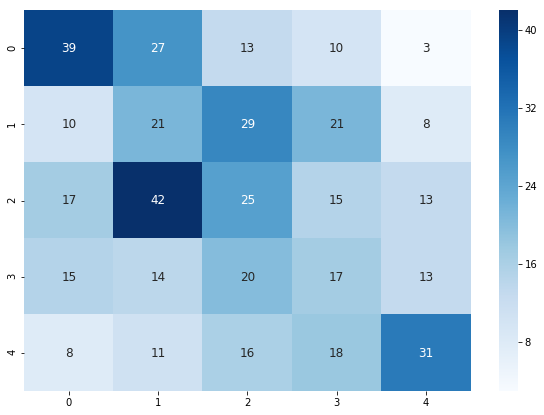

In [209]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(penta_test.Penta_target, logic_bag.predict(penta_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [210]:
print(classification_report(penta_test.Penta_target, logic_bag.predict(penta_test.textacy)))

              precision    recall  f1-score   support

           0       0.44      0.42      0.43        92
           1       0.18      0.24      0.21        89
           2       0.24      0.22      0.23       112
           3       0.21      0.22      0.21        79
           4       0.46      0.37      0.41        84

   micro avg       0.29      0.29      0.29       456
   macro avg       0.31      0.29      0.30       456
weighted avg       0.30      0.29      0.30       456



- Left became the best category to be predicted. Almost keep the same precision and recall of the normal bigger dataset. Right slightly worst but still acceptable. In the centre there is a bit of confusion.

In [211]:
multi_nb.score(penta_test.textacy, penta_test.Penta_target)

0.3267543859649123

- Confusion matrix and Correlation Report

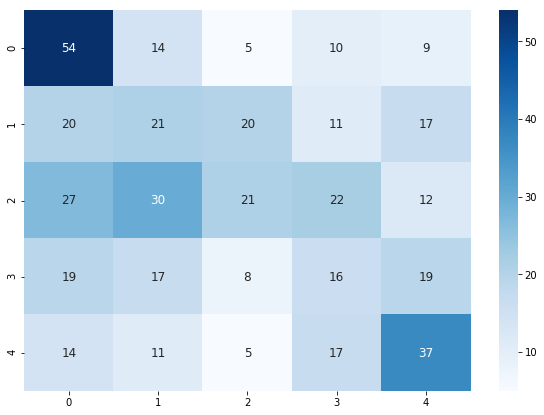

In [212]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(penta_test.Penta_target, multi_nb.predict(penta_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [213]:
print(classification_report(penta_test.Penta_target, multi_nb.predict(penta_test.textacy)))


              precision    recall  f1-score   support

           0       0.40      0.59      0.48        92
           1       0.23      0.24      0.23        89
           2       0.36      0.19      0.25       112
           3       0.21      0.20      0.21        79
           4       0.39      0.44      0.42        84

   micro avg       0.33      0.33      0.33       456
   macro avg       0.32      0.33      0.32       456
weighted avg       0.32      0.33      0.31       456



- Even better in the extreme for Multinomial NB, but slightly worst in the centre. Let's check the mistakes

### Mismatch

In [214]:
prob_multi_nb_test = list(multi_nb.predict_proba(penta_test.textacy))

In [215]:
penta_test['probability'] = prob_multi_nb_test

In [216]:
pred_multi_nb_test = multi_nb.predict(penta_test.textacy)
#prob_multi_nb_test = multi_nb.predict_proba(penta_test.textacy)

# Incorrectly classified
incorrect_preds_multi_nb_test = penta_test[(pred_multi_nb_test != penta_test['Penta_target'])]
incorrect_preds_multi_nb_test = (pred_multi_nb_test != penta_test['Penta_target'])

In [217]:
incorrect_multi_nb_test = pd.DataFrame({'actual': penta_test['Penta_target'],
                                       'predicted': pred_multi_nb_test,
                                       'mismatch': incorrect_preds_multi_nb_test,
                                        'prob': penta_test.probability,
                                       'TEXT': penta_test.Quotes,
                                       'Author': penta_test.Author,
                                       'Processed text': penta_test.textacy})

print(incorrect_multi_nb_test[incorrect_multi_nb_test.mismatch == True].shape)
incorrect_multi_nb_test[incorrect_multi_nb_test.mismatch == True]

(307, 7)


,actual,predicted,mismatch,prob,TEXT,Author,Processed text
0,0,4,True,"[0.09618843512767414, 0.038449436947979254, 0.03722564574047935, 0.010818865222978766, 0.8173176169608908]","[T]here are in fact no masses, but only ways of seeing people as masses.",Raymond Williams,t here are in fact no mass but only way of seeing people a mass
1,0,1,True,"[0.1810431085349869, 0.602616226912304, 0.18259237775382167, 0.009881937480017929, 0.023866349318866175]","It is the definition of an egoist that whatever occupies his attention is, for that reason, important.",Raymond Williams,it is the definition of an egoist that whatever occupies his attention is for that reason important
2,0,3,True,"[0.00014279987380030676, 0.019004001220684498, 0.0008905236672365378, 0.9799616078089051, 1.067429356497492e-06]","From the late eighteenth century onwards, it is no longer from the practice of community but from being a wanderer that the instinct of fellow-feeling is derived. Thus an essential isolation and silence and loneliness become the carriers of nature and community against the rigours, the cold abstinence, the selfish ease of ordinary society.",Raymond Williams,from the late eighteenth century onwards it is no longer from the practice of community but from being a wanderer that the instinct of fellow feeling is derived thus an essential isolation and silence and loneliness become the carrier of nature and community against the rigour the cold abstinence the selfish ease of ordinary society
3,0,3,True,"[0.21601157119583067, 0.1782698445757677, 0.055304151663510895, 0.29809976129782473, 0.2523146712670597]","There was, however, a difference between his mood and that of the rest of the cabinet. They felt desperate; he felt challenged.",Raymond Williams,there wa however a difference between his mood and that of the rest of the cabinet they felt desperate he felt challenged
4,0,3,True,"[0.028130000882476247, 0.005008127664309867, 0.0004329882562568546, 0.7796124463040277, 0.18681643689294558]","If Gissing is less compassionately observant than Mrs Gaskell, less overtly polemical than Kingsley, still The Nether World and Demos would be sympathetically endorsed by either of them, or by their typical readers. Yet Gissing does introduce an important new element, and one that remains significant. He has often been called ‘the spokesman of despair,’ and this is true in both meanings of the phrase. Like Kingsley and Mrs Gaskell, he writes to describe the true conditions of the poor, and to protest against those brute forces of society which fill with wreck the abysses of the nether world. Yet he is also the spokesman of another kind of despair: the despair born of social and political disillusion. In this he is a figure exactly like Orwell in our own day, and for much the same reason. Whether one calls this honesty or not will depend on experience.",Raymond Williams,if gissing is le compassionately observant than mr gaskell le overtly polemical than kingsley still the nether world and demo would be sympathetically endorsed by either of them or by their typical reader yet gissing doe introduce an important new element and one that remains significant he ha often been called the spokesman of despair and this is true in both meaning of the phrase like kingsley and mr gaskell he writes to describe the true condition of the poor and to protest against those brute force of society which fill with wreck the abyss of the nether world yet he is also the spokesman of another kind of despair the despair born of social and political disillusion in this he is a figure exactly like orwell in our own day and for much the same reason whether one call this honesty or not will depend on experience
5,0,1,True,"[0.01568229144286744, 0.9808214340974997, 0.0034893019650363145, 6.594726329434863e-06, 3.7776826296747597e-07]",Today's Europeans and Americans who reached the age of awareness after midcentury when the communications revolution lead to expectations of instantanaiy ar

- Many of these quotes are probably neutral. With a larger corpus we could investigate if there is a lexicon for each category behind the main important words. Anyway we still see coherence with our previous tests. There could be a little of overfitting with the authors as well.

In [218]:
copy_incorrect_test = incorrect_multi_nb_test[incorrect_multi_nb_test.mismatch == True]

In [219]:
copy_incorrect_test['grade'] = (copy_incorrect_test.actual - copy_incorrect_test.predicted).abs()

In [220]:
print(copy_incorrect_test[copy_incorrect_test.grade == 1].shape)
copy_incorrect_test[copy_incorrect_test.grade == 1]

(150, 8)


,actual,predicted,mismatch,prob,TEXT,Author,Processed text,grade
1,0,1,True,"[0.1810431085349869, 0.602616226912304, 0.18259237775382167, 0.009881937480017929, 0.023866349318866175]","It is the definition of an egoist that whatever occupies his attention is, for that reason, important.",Raymond Williams,it is the definition of an egoist that whatever occupies his attention is for that reason important,1
5,0,1,True,"[0.01568229144286744, 0.9808214340974997, 0.0034893019650363145, 6.594726329434863e-06, 3.7776826296747597e-07]",Today's Europeans and Americans who reached the age of awareness after midcentury when the communications revolution lead to expectations of instantanaiy are exasperated by the slow toils of history. They assume that the thunderclap of cause will be swiftly followed by the lightening bolt of effect.,Raymond Williams,today s european and american who reached the age of awareness after midcentury when the communication revolution lead to expectation of instantanaiy are exasperated by the slow toil of history they assume that the thunderclap of cause will be swiftly followed by the lightening bolt of effect,1
6,0,1,True,"[0.013262222675355956, 0.918430450456169, 0.007112402357046219, 0.0012171840602623065, 0.059977740451167744]","Biographer diagnoses reaction to restriction as a tell of true character. Some use even prison as a time of reflection and planning. Others, like Churchill, quickly chafe at missing interaction and opportunity.",Raymond Williams,biographer diagnosis reaction to restriction a a tell of true character some use even prison a a time of reflection and planning others like churchill quickly chafe at missing interaction and opportunity,1
15,0,1,True,"[0.20531708317748787, 0.7901999577958642, 3.329440040345919e-05, 0.004146893462244016, 0.00030277116400357745]","The WTO was put in place following the signing of a ""technical agreement"" negotiated behind closed doors by bureaucrats. Even the heads of country-level delegations to Marrakech in 1994 were not informed regarding the statutes of the WTO, which were drafted in separate clossed sessions by technocrats.",Michel Chossudovsky,the wto wa put in place following the signing of a technical agreement negotiated behind closed door by bureaucrat even the head of country level delegation to marrakech in were not informed regarding the statute of the wto which were drafted in separate clossed session by technocrat,1
18,0,1,True,"[0.27531958814781504, 0.5844933167549147, 0.018353594223094946, 0.1093770735023937, 0.012456427371776529]","According to the World Bank, the concentration of wealth and the structures of corporate economic power have no bearing on woman's rights.",Michel Chossudovsky,according to the world bank the concentration of wealth and the structure of corporate economic power have no bearing on woman s right,1
25,0,1,True,"[0.008874950389177608, 0.9794381997502686, 0.0003076913837613804, 0.011027748631296172, 0.0003514098454997537]","Macro-economic policy had accelerated the ""expulsion"" of landless peasants from the countryside leading to the formation of a nomadic migrant labor force moving from one metropolitan area to another.",Michel Chossudovsky,macro economic policy had accelerated the expulsion of landless peasant from the countryside leading to the formation of a nomadic migrant labor force moving from one metropolitan area to another,1
26,0,1,True,"[6.209942347603509e-06, 0.9998085237764144, 3.487676847707324e-06, 9.716175325486342e-08, 0.00018168144262738258]","Macro-economic reform undermined the legal economy, reinforced illicit trade and contributed to the recycling of ""dirty money"" towards Peru's official and commercial creditors.",Michel Chossudovsky,macro economic reform undermined the legal economy reinforced illicit trade and contributed to the recycling of dirty money towards peru s official and commercial creditor,1
30,0,1,True,"[0.00022028277485287005, 0.9593064059975053, 1.0289282920576648e-05, 0.04009

- We can see in this subset the errors that we can tolerate

# Modelling with Tf-Idf

<a id='tf-idf-vectorizer'></a>

- Tf-Idf means: term frequency–inverse document frequency. It give the each word a weight based in this case to the inverse of the frequency. Less we use a word, more important the word will be.

- Again we will start with Logistic Regression as first model to try

## Logitsic Regression

In [221]:
log_tfi = Pipeline([
    ('tfi', TfidfVectorizer(stop_words=stops, ngram_range=(1,3))),
    ('model',LogisticRegression())])

In [222]:
log_tfi.fit(X_train.textacy, y_train)

Pipeline(memory=None,
     steps=[('tfi', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 3), norm='l2', preprocessor=None, smooth_idf=True,
 ...penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False))])

In [223]:
log_tfi.score(X_test.textacy, y_test)

0.4905115511551155

- Confusion Matrix

Confusion Matrix and Correlation Report

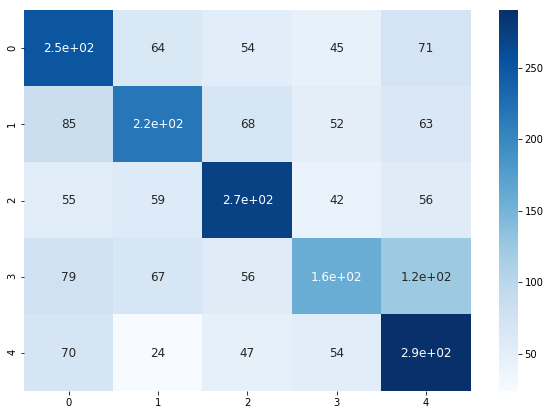

In [224]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_test, log_tfi.predict(X_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

- Classification Report

In [225]:
print(classification_report(y_test, log_tfi.predict(X_test.textacy)))

              precision    recall  f1-score   support

           0       0.46      0.52      0.49       485
           1       0.50      0.45      0.47       485
           2       0.55      0.56      0.55       484
           3       0.45      0.33      0.38       485
           4       0.48      0.60      0.53       485

   micro avg       0.49      0.49      0.49      2424
   macro avg       0.49      0.49      0.49      2424
weighted avg       0.49      0.49      0.49      2424



- The confusion matrix is less linear than before. It has a strong diagonal, but it has quite few false negative fat from the true value. Once again Conservative is the worst category with a recall of 28%. Moderate became our best category with this model.

### Best coefficient

- Using the same function we used before we can get our best coefficients and plot them. 

In [226]:
importance = get_important_words(log_tfi.steps[0][1], log_tfi.steps[1][1], 20)

#### Best and worst words for the Lefts

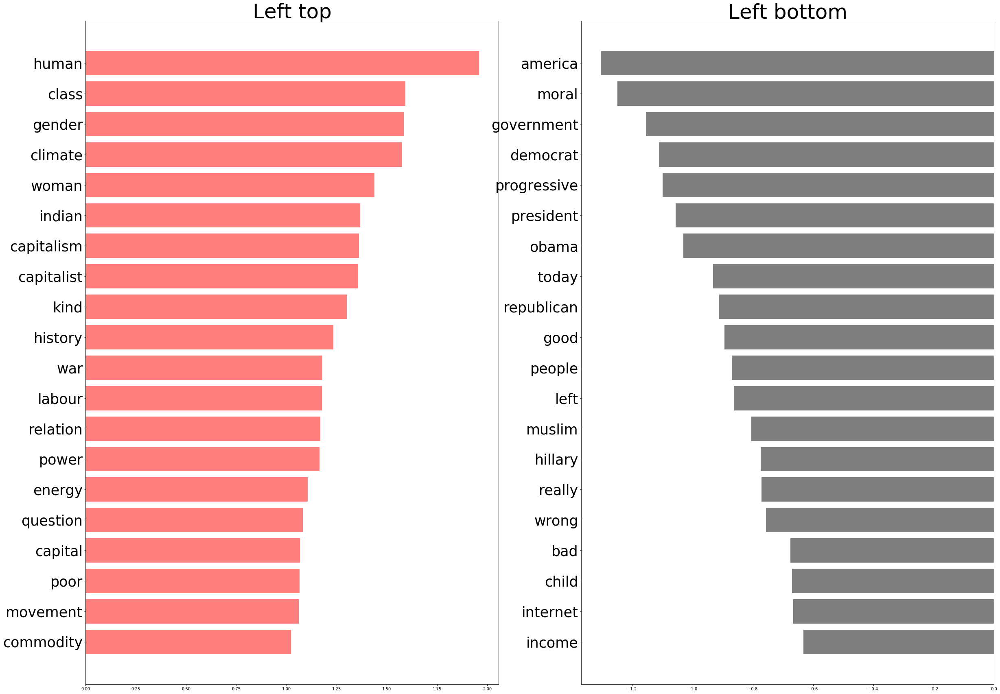

In [227]:
plot_words(importance, 0)

#### Best and worst words for the Progressive

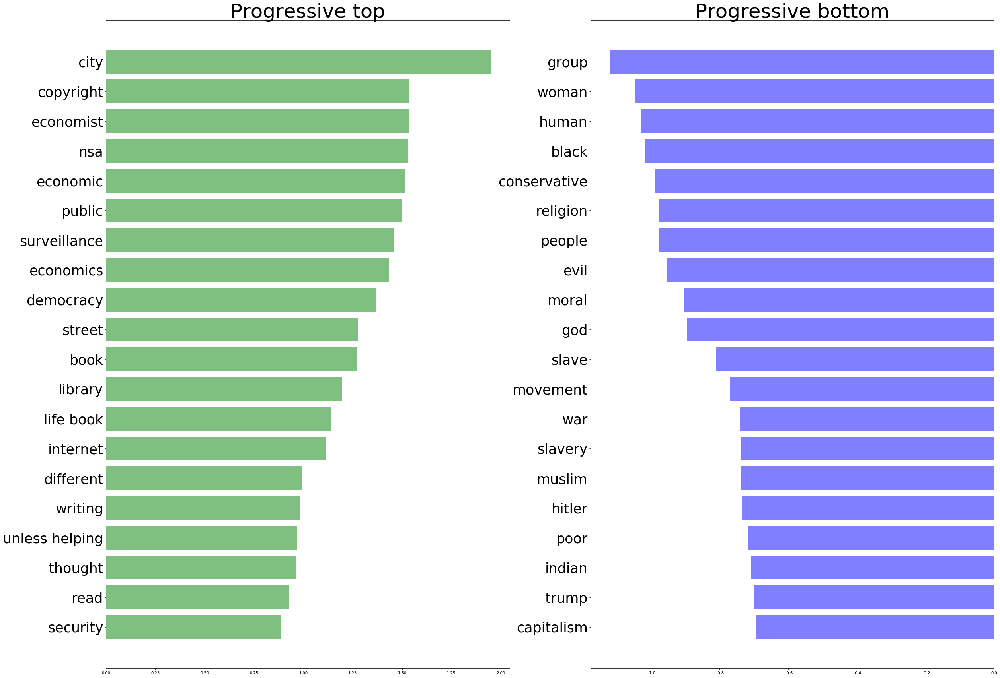

In [228]:
plot_words(importance,1)

#### Best and worst words for the Moderate

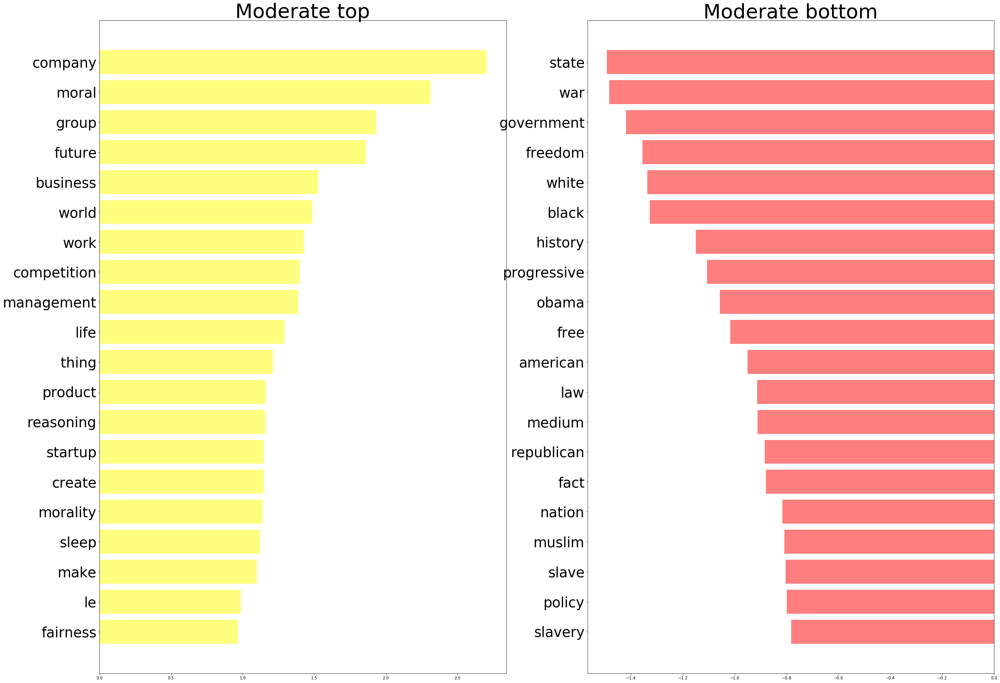

In [229]:
plot_words(importance, 2)

#### Best and worst words for the Conservative

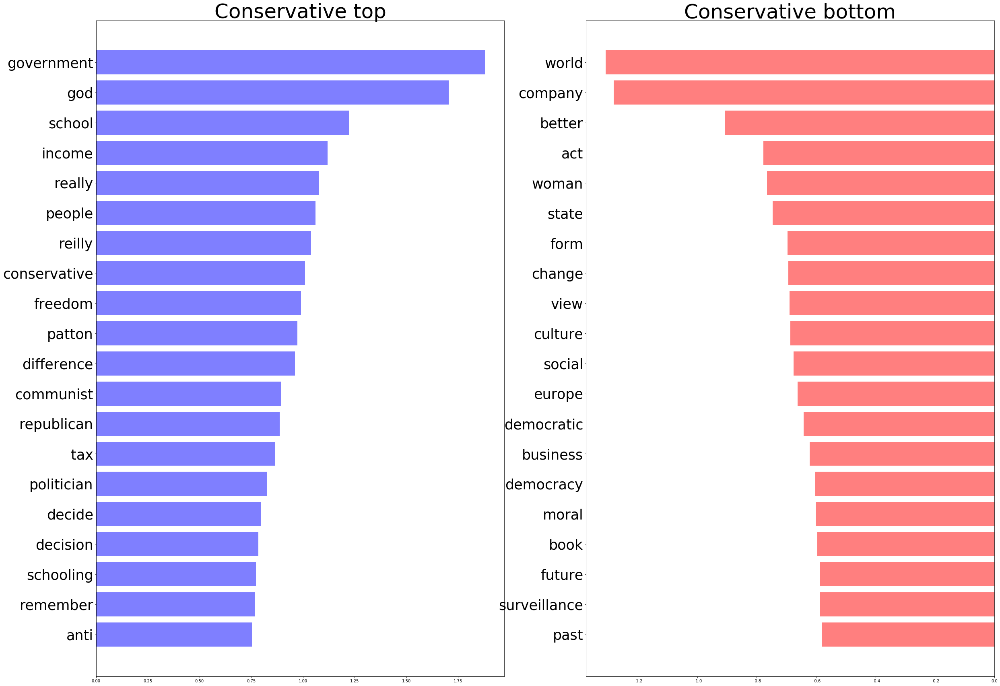

In [230]:
plot_words(importance, 3)

#### Best and worst words for the Right

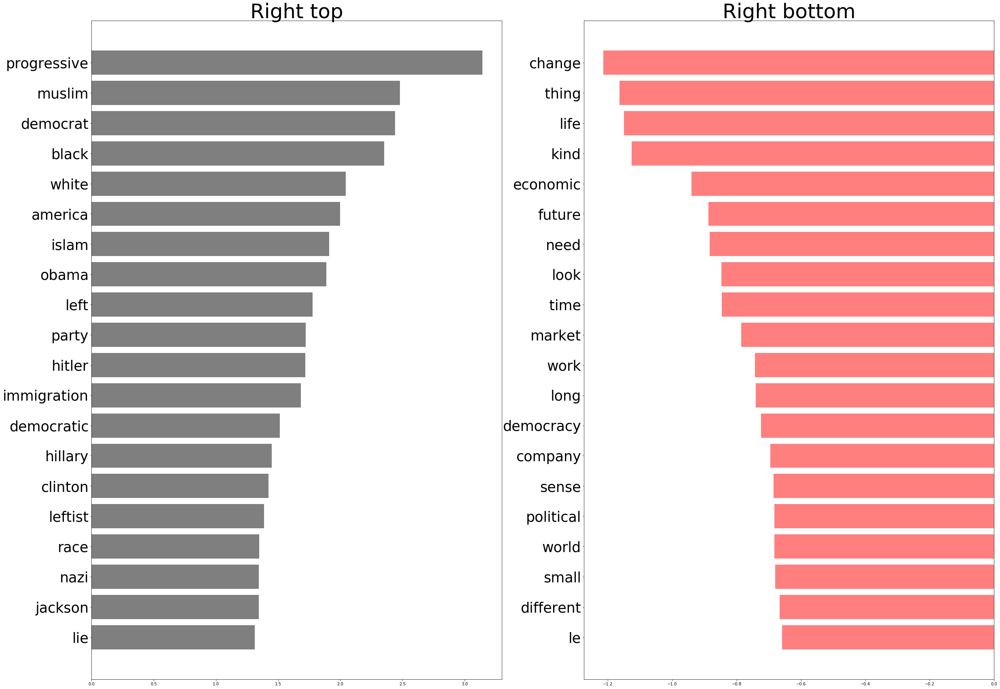

In [231]:
plot_words(importance, 4)

- The first Right coefficient is the the feature with more weight. Which is one of our category. In a sentence with the word Progressive there is a very high change that it will predict Right.

### Using GridSearchCV

In [232]:
params={'model__C':[.01,.05,.1,.5,1,5,10],
           'model__penalty':['l1','l2']}
log_tfi_grid = GridSearchCV(log_tfi, cv=5, param_grid=params ,scoring='accuracy')


In [233]:
log_tfi_grid.fit(X_train.textacy, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=Pipeline(memory=None,
     steps=[('tfi', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 3), norm='l2', preprocessor=None, smooth_idf=True,
 ...penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False))]),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'model__C': [0.01, 0.05, 0.1, 0.5, 1, 5, 10], 'model__penalty': ['l1', 'l2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [234]:
log_tfi_grid.best_estimator_

Pipeline(memory=None,
     steps=[('tfi', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 3), norm='l2', preprocessor=None, smooth_idf=True,
 ...penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False))])

In [235]:
log_tfi_grid.score(X_test.textacy, y_test)

0.5033003300330033

- Running a GridSearch on the Logistic Regression we had very little improvement. Not very significant. For this reason I am not going to investigate this new Logistica Regression. It will gave me probably the same result than before.

## Modelling with other classifier

- As before we try other classifiers

In [236]:
models = [('dt',DecisionTreeClassifier()), 
          ('nb', MultinomialNB()), 
          ('svm', SVC(kernel='linear')), 
          ('knn', KNeighborsClassifier()), 
          ('rf', RandomForestClassifier()),
          ('nbb', BernoulliNB())]

In [237]:
for model in models:
    pipe_models = Pipeline([
    ('vect', CountVectorizer(stop_words=stops, ngram_range=(1,3))),
    ('tfidf', TfidfTransformer()),
    (model)])
    print(model[1])
    pipe_models.fit(X_train.textacy, y_train)
    print(pipe_models.score(X_test.textacy, y_test))
    print()
    print()

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.3226072607260726


MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
0.5148514851485149


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)
0.5004125412541254


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')
0.43028052805280526


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=No

## Investigating the best Model: MultinomialNB

- Exactly like with CounterVectorizer Multinomial NB and SVC give the the best score. Let's investigate as before Multinomial NB and let's try to tune the alpha.

In [238]:
pipe_NB = Pipeline([
    ('vect', TfidfVectorizer(stop_words=stops, ngram_range=(1,3))),
    ('clf', MultinomialNB(0.3))])


In [239]:
pipe_NB.fit(X_train.textacy, y_train)
pipe_NB.score(X_test.textacy, y_test)

0.5198019801980198

- Confusion Matrix and Classification Report

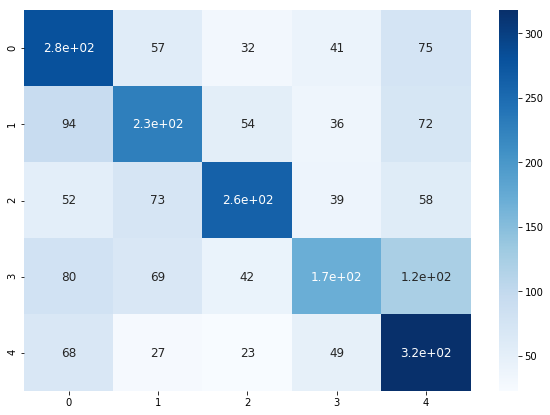

In [240]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_test, pipe_NB.predict(X_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [241]:
print(classification_report(y_test, pipe_NB.predict(X_test.textacy)))

              precision    recall  f1-score   support

           0       0.49      0.58      0.53       485
           1       0.50      0.47      0.49       485
           2       0.63      0.54      0.58       484
           3       0.51      0.35      0.42       485
           4       0.49      0.66      0.56       485

   micro avg       0.52      0.52      0.52      2424
   macro avg       0.53      0.52      0.52      2424
weighted avg       0.53      0.52      0.52      2424



- One of the reason why Left and Right have usually a consistent score with Multinomial NB can become from the bigger number of words they have in it. Increasing the probability that given a class, a word is part of that class, and these should explain also the higher recall and the lower precision.

### Get top features for the MultinomialNB

In [242]:
pipe_NB.steps

[('vect', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
          dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
          lowercase=True, max_df=1.0, max_features=None, min_df=1,
          ngram_range=(1, 3), norm='l2', preprocessor=None, smooth_idf=True,
          stop_words=frozenset({'down', 'everyone', 'almost', 'before', 'hereupon', 'after', 'since', 'myself', 'co', 'sincere', 'thereafter', 'want', 'others', 'am', 'several', 'alone', 'always', 'indeed', 'someone', 'thereby', 'thereupon', 'i', 'herein', 'once', 'whole', 'either', 'rather', 'cant', 'made', ...inc', 'whoever', 'beyond', 'had', 'behind', 'beforehand', 'per', 'top', 'those', 'wherever', 'why'}),
          strip_accents=None, sublinear_tf=False,
          token_pattern='(?u)\\b\\w\\w+\\b', tokenizer=None, use_idf=True,
          vocabulary=None)),
 ('clf', MultinomialNB(alpha=0.3, class_prior=None, fit_prior=True))]

In [243]:
tvec = pipe_NB.steps[0][1]

In [244]:
Xtr = tvec.fit_transform(X_train.textacy)
features = tvec.get_feature_names()

In [245]:
def top_tfidf_feats(row, features, top_n=25):
    ''' Get top n tfidf values in row and return them with their corresponding feature names.'''
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    df = pd.DataFrame(top_feats)
    df.columns = ['feature', 'val']
    return df

In [246]:
def top_feats_in_doc(Xtr, features, row_id, top_n=25):

    row = np.squeeze(Xtr[row_id].toarray())
    return top_tfidf_feats(row, features, top_n)

In [247]:
def top_mean_feats(Xtr, features, grp_ids=None, min_tfidf=0.1, top_n=25):
    
    if grp_ids:
        D = Xtr[grp_ids].toarray()
    else:
        D = Xtr.toarray()

    D[D < min_tfidf] = 0
    tfidf_means = np.mean(D, axis=0)
    return top_tfidf_feats(tfidf_means, features, top_n)

In [248]:
def top_feats_by_class(Xtr, y, features, min_tfidf=0.1, top_n=25):
 
    dfs = []
    labels = np.unique(y)
    for label in labels:
        ids = np.where(y==label)
        feats_df = top_mean_feats(Xtr, features, ids, min_tfidf=min_tfidf, top_n=top_n)
        feats_df.label = label
        dfs.append(feats_df)
    return dfs

In [249]:
feat = top_feats_by_class(Xtr, y_train, features)

In [250]:
best_feat = pd.concat([feat[0], feat[1], feat[2], feat[3], feat[4]], axis=1)

- A dataframe with words and weight by class.

In [251]:
best_feat.columns = ['Left','tfi_left','Progressive','tfi_progressive', 'Moderate', 'tfi_moderate', 'Conservative', 'tfi_conservative', 'Right', 'tfi_right']

In [252]:
best_feat

,Left,tfi_left,Progressive,tfi_progressive,Moderate,tfi_moderate,Conservative,tfi_conservative,Right,tfi_right
0,human,0.002754,book,0.002669,company,0.004083,government,0.003975,black,0.003881
1,war,0.002621,city,0.002337,future,0.002995,god,0.003378,progressive,0.003598
2,woman,0.002521,democracy,0.002178,group,0.002918,conservative,0.002169,muslim,0.003227
3,gender,0.002258,life book,0.002150,life,0.002886,problem,0.002087,party,0.002966
4,class,0.002016,surveillance,0.002136,world,0.002772,republican,0.002060,white,0.002759
5,mean,0.001960,market,0.002058,work,0.002726,freedom,0.002056,democrat,0.002625
6,freedom,0.001928,life,0.002018,moral,0.002720,income,0.001990,islam,0.002454
7,power,0.001886,culture,0.002015,business,0.002629,power,0.001921,obama,0.002351
8,indian,0.001852,know,0.001980,love,0.002408,believe,0.001888,republican,0.002343
9,right,0.001722,social,0.001910,thing,0.002225,right,0.001882,jackson,0.002297


##### Weight of the Tfi coefficient for the Left

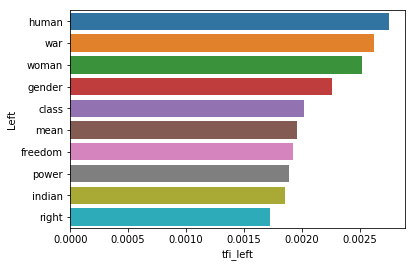

In [253]:
figsize=(30,10)
sns.barplot(x=best_feat.iloc[:10,1], y=best_feat.iloc[:10,0])

##### Weight of the Tfi coefficient for the Progressive

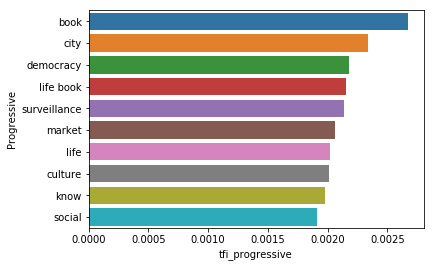

In [254]:
figsize=(30,10)
sns.barplot(x=best_feat.iloc[:10,3], y=best_feat.iloc[:10,2])

##### Weight of the Tfi coefficient for the Moderate

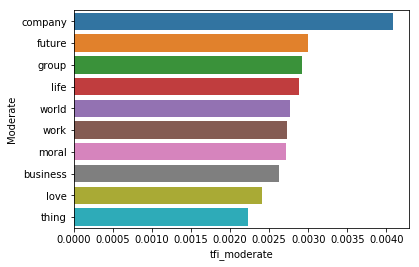

In [255]:
figsize=(30,10)
sns.barplot(x=best_feat.iloc[:10,5], y=best_feat.iloc[:10,4])

##### Weight of the Tfi coefficient for the Conservative

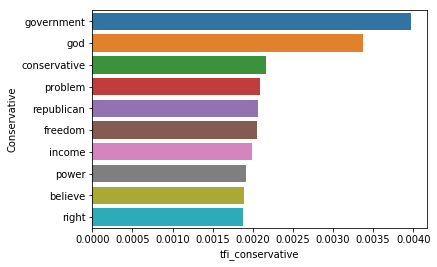

In [256]:
figsize=(30,10)
sns.barplot(x=best_feat.iloc[:10,7], y=best_feat.iloc[:10,6])

##### Weight of the Tfi coefficient for the Right

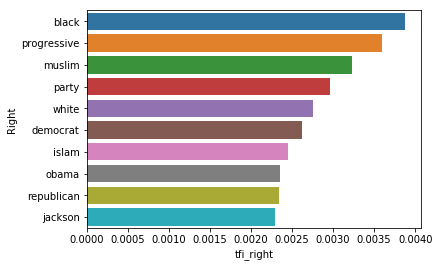

In [257]:
figsize=(30,10)
sns.barplot(x=best_feat.iloc[:10,9], y=best_feat.iloc[:10,8])

- As before the Right as some very strong weight value, like "black" and "muslim". The moderate have "company". The Conservative have "Governament" as strongest value which is present also in the ranking of Progressive. It is probably the only category that has the best feature also in the other category.

### External Dataset

- Multinomial NB on the external dataset

In [258]:
pipe_NB.score(penta_test.textacy, penta_test.Penta_target)

0.3223684210526316

- Confusion Matrix and Correlation Report

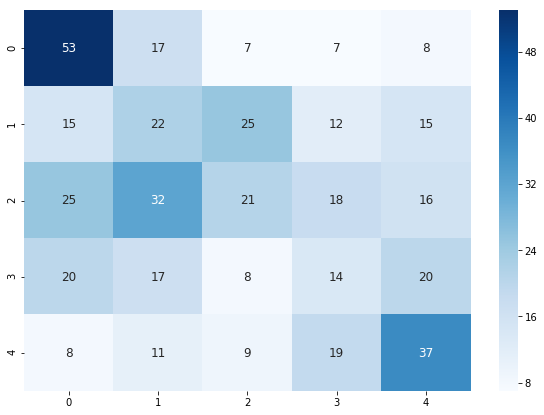

In [259]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(penta_test.Penta_target, pipe_NB.predict(penta_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [260]:
print(classification_report(penta_test.Penta_target, pipe_NB.predict(penta_test.textacy)))


              precision    recall  f1-score   support

           0       0.44      0.58      0.50        92
           1       0.22      0.25      0.23        89
           2       0.30      0.19      0.23       112
           3       0.20      0.18      0.19        79
           4       0.39      0.44      0.41        84

   micro avg       0.32      0.32      0.32       456
   macro avg       0.31      0.33      0.31       456
weighted avg       0.31      0.32      0.31       456



- In line with the other naive Bayes models, also this time it is strong at the extreme and sufficient for moderate. Insufficient on the Conservative and Progressive

### Mismatch

In [261]:
prob_pipe_NB_test = list(pipe_NB.predict_proba(penta_test.textacy))

In [262]:
penta_test['probability'] = prob_pipe_NB_test

In [263]:
pred_pipe_NB_test = pipe_NB.predict(penta_test.textacy)

# Incorrectly classified
incorrect_preds_pipe_NB_test = penta_test[(pred_pipe_NB_test != penta_test['Penta_target'])]
incorrect_preds_pipe_NB_test = (pred_pipe_NB_test != penta_test['Penta_target'])

In [264]:
incorrect_pipe_NB_test = pd.DataFrame({'actual': penta_test['Penta_target'],
                                       'predicted': pred_pipe_NB_test,
                                       'mismatch': incorrect_preds_pipe_NB_test,
                                        'prob': penta_test.probability,
                                       'TEXT': penta_test.Quotes,
                                       'Author': penta_test.Author,
                                       'Processed text': penta_test.textacy})

print(incorrect_pipe_NB_test[incorrect_pipe_NB_test.mismatch == True].shape)
incorrect_pipe_NB_test[incorrect_pipe_NB_test.mismatch == True]

(309, 7)


,actual,predicted,mismatch,prob,TEXT,Author,Processed text
0,0,4,True,"[0.24332894144752548, 0.16366566261107562, 0.14428221126059676, 0.1441333624777391, 0.3045898222030634]","[T]here are in fact no masses, but only ways of seeing people as masses.",Raymond Williams,t here are in fact no mass but only way of seeing people a mass
1,0,2,True,"[0.18990410527664103, 0.25489419108432, 0.27351787875560596, 0.1240457647563027, 0.15763806012713152]","It is the definition of an egoist that whatever occupies his attention is, for that reason, important.",Raymond Williams,it is the definition of an egoist that whatever occupies his attention is for that reason important
2,0,3,True,"[0.11942777291723687, 0.21585607003029725, 0.19467909595745167, 0.33837346194166856, 0.13166359915334327]","From the late eighteenth century onwards, it is no longer from the practice of community but from being a wanderer that the instinct of fellow-feeling is derived. Thus an essential isolation and silence and loneliness become the carriers of nature and community against the rigours, the cold abstinence, the selfish ease of ordinary society.",Raymond Williams,from the late eighteenth century onwards it is no longer from the practice of community but from being a wanderer that the instinct of fellow feeling is derived thus an essential isolation and silence and loneliness become the carrier of nature and community against the rigour the cold abstinence the selfish ease of ordinary society
3,0,1,True,"[0.1905634639353136, 0.23494098487163434, 0.19702418412658745, 0.22226988415332946, 0.15520148291313696]","There was, however, a difference between his mood and that of the rest of the cabinet. They felt desperate; he felt challenged.",Raymond Williams,there wa however a difference between his mood and that of the rest of the cabinet they felt desperate he felt challenged
4,0,4,True,"[0.22305601602560604, 0.17218314745721874, 0.1542198957161298, 0.20200220398935254, 0.24853873681169522]","If Gissing is less compassionately observant than Mrs Gaskell, less overtly polemical than Kingsley, still The Nether World and Demos would be sympathetically endorsed by either of them, or by their typical readers. Yet Gissing does introduce an important new element, and one that remains significant. He has often been called ‘the spokesman of despair,’ and this is true in both meanings of the phrase. Like Kingsley and Mrs Gaskell, he writes to describe the true conditions of the poor, and to protest against those brute forces of society which fill with wreck the abysses of the nether world. Yet he is also the spokesman of another kind of despair: the despair born of social and political disillusion. In this he is a figure exactly like Orwell in our own day, and for much the same reason. Whether one calls this honesty or not will depend on experience.",Raymond Williams,if gissing is le compassionately observant than mr gaskell le overtly polemical than kingsley still the nether world and demo would be sympathetically endorsed by either of them or by their typical reader yet gissing doe introduce an important new element and one that remains significant he ha often been called the spokesman of despair and this is true in both meaning of the phrase like kingsley and mr gaskell he writes to describe the true condition of the poor and to protest against those brute force of society which fill with wreck the abyss of the nether world yet he is also the spokesman of another kind of despair the despair born of social and political disillusion in this he is a figure exactly like orwell in our own day and for much the same reason whether one call this honesty or not will depend on experience
5,0,1,True,"[0.22584610627812476, 0.3375218370819224, 0.2061530989945454, 0.12113100121659036, 0.10934795642881422]",Today's Europeans and Americans who reached the age of awareness after midcentury when the communications revolution lead to expectations of instantanaiy are exasperated by the slow

In [265]:
copy_incorrect_pipe_test = incorrect_pipe_NB_test[incorrect_pipe_NB_test.mismatch == True]

In [266]:
copy_incorrect_pipe_test['grade'] = (copy_incorrect_pipe_test.actual - copy_incorrect_pipe_test.predicted).abs()

In [267]:
print(copy_incorrect_pipe_test[copy_incorrect_pipe_test.grade == 1].shape)
copy_incorrect_pipe_test[copy_incorrect_pipe_test.grade==1]

(154, 8)


,actual,predicted,mismatch,prob,TEXT,Author,Processed text,grade
3,0,1,True,"[0.1905634639353136, 0.23494098487163434, 0.19702418412658745, 0.22226988415332946, 0.15520148291313696]","There was, however, a difference between his mood and that of the rest of the cabinet. They felt desperate; he felt challenged.",Raymond Williams,there wa however a difference between his mood and that of the rest of the cabinet they felt desperate he felt challenged,1
5,0,1,True,"[0.22584610627812476, 0.3375218370819224, 0.2061530989945454, 0.12113100121659036, 0.10934795642881422]",Today's Europeans and Americans who reached the age of awareness after midcentury when the communications revolution lead to expectations of instantanaiy are exasperated by the slow toils of history. They assume that the thunderclap of cause will be swiftly followed by the lightening bolt of effect.,Raymond Williams,today s european and american who reached the age of awareness after midcentury when the communication revolution lead to expectation of instantanaiy are exasperated by the slow toil of history they assume that the thunderclap of cause will be swiftly followed by the lightening bolt of effect,1
6,0,1,True,"[0.16226958910276365, 0.3042518728474293, 0.19733547270332472, 0.1685216410612503, 0.1676214242852302]","Biographer diagnoses reaction to restriction as a tell of true character. Some use even prison as a time of reflection and planning. Others, like Churchill, quickly chafe at missing interaction and opportunity.",Raymond Williams,biographer diagnosis reaction to restriction a a tell of true character some use even prison a a time of reflection and planning others like churchill quickly chafe at missing interaction and opportunity,1
12,0,1,True,"[0.16819355442498193, 0.22704265548518224, 0.22456748988739275, 0.1686447436282872, 0.21155155657415878]","Relentlessly feeding on poverty and economic dislocation, a New World Order was taking shape.",Michel Chossudovsky,relentlessly feeding on poverty and economic dislocation a new world order wa taking shape,1
15,0,1,True,"[0.21992788591539808, 0.30434276718638814, 0.11177403048746938, 0.21830699319703134, 0.14564832321371113]","The WTO was put in place following the signing of a ""technical agreement"" negotiated behind closed doors by bureaucrats. Even the heads of country-level delegations to Marrakech in 1994 were not informed regarding the statutes of the WTO, which were drafted in separate clossed sessions by technocrats.",Michel Chossudovsky,the wto wa put in place following the signing of a technical agreement negotiated behind closed door by bureaucrat even the head of country level delegation to marrakech in were not informed regarding the statute of the wto which were drafted in separate clossed session by technocrat,1
25,0,1,True,"[0.24338143550796332, 0.26505702624012656, 0.16276551142698775, 0.17975962374522939, 0.1490364030796936]","Macro-economic policy had accelerated the ""expulsion"" of landless peasants from the countryside leading to the formation of a nomadic migrant labor force moving from one metropolitan area to another.",Michel Chossudovsky,macro economic policy had accelerated the expulsion of landless peasant from the countryside leading to the formation of a nomadic migrant labor force moving from one metropolitan area to another,1
26,0,1,True,"[0.16328686463081, 0.41707443708585057, 0.13498598543597903, 0.10283995012510763, 0.18181276272225372]","Macro-economic reform undermined the legal economy, reinforced illicit trade and contributed to the recycling of ""dirty money"" towards Peru's official and commercial creditors.",Michel Chossudovsky,macro economic reform undermined the legal economy reinforced illicit trade and contributed to the recycling of dirty money towards peru s official and commercial creditor,1
30,0,1,True,"[0.14062701422884918, 0.2966682536077857, 0.17360100688826519, 0.2073080536817073, 0.18179567159339433]","While Financier George Soros was investing money 

- The score on the external dataset is basically the same of the Multinomial NB with CountVectorizer, but we have few acceptable errors. Some of the prediction are more wrong than before.

### Smooth Confusion Matrix and threshold Confusion Matrix

- Smooth Confusion Matrix: return a confusion Matrix considering the closest FN and FP, since the the 2 closest class might have similar behavior
- Threshold Confusion Matrix: return a confusion Matrix considering the probability

In [268]:
def make_smooth_confusion(conf):
    replica = np.copy(conf)
    for i in range(len(conf)):
        if i == 0:
            replica[i,i] = conf[i,i] + conf[i,i+1] 
        elif i == 4:
            replica[i,i] = conf[i,i] + conf[i,i-1]
        else:
            replica[i,i] = conf[i,i] + conf[i,i+1]+ conf[i,i-1]
    return replica

In [269]:
def threshold_confusion_matrix(df, model, target, threshold):
    
    prediction = model.predict(df.textacy)
    probability = model.predict_proba(df.textacy)
    df['Prediction'] = prediction
    df['Proba_left'] = probability[:,0]
    df['Proba_prog'] = probability[:,1]
    df['Proba_moderate'] = probability[:,2]
    df['Proba_cons'] = probability[:,3]
    df['Proba_right'] = probability[:,4]
    prob_list_col = [col for col in df.columns if 'Proba' in col] 
    temp_df = pd.concat([df[prob_list_col], df[target]], axis=1)
    temp_df['thre']=temp_df[prob_list_col].idxmax(axis=1)
    temp_df['value']= temp_df[prob_list_col].max(axis=1)
    fin = temp_df[temp_df['value']>threshold]
    diz_cat = {col:i for i, col in enumerate(prob_list_col)}
    fin['thre'] = fin['thre'].map(diz_cat)
    conf = confusion_matrix(fin[target], fin.thre)
    
    return conf

- Confusion Matrix and Correlation report for the threshold in the probability of 0.5

In [270]:
conf_test = threshold_confusion_matrix(X_test, pipe_NB, 'Penta_target', 0.5)

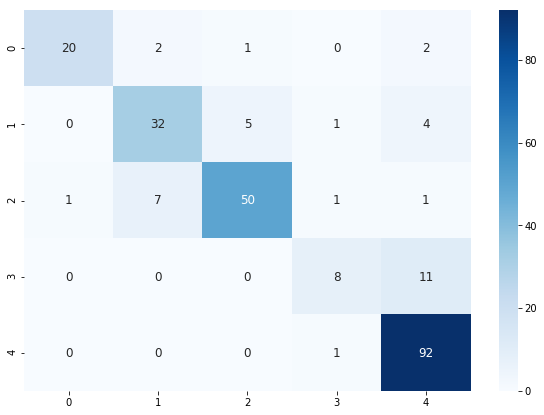

In [271]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(conf_test), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

- As we said the Right have the strongest coefficient and as consequence we have strong probablity in the decision. We mention also some comefficient for moderate. For the Left is probably a cumulative value between the features, since the tops didn't have such a strong value.

In [272]:
smooth_test = make_smooth_confusion(conf_test)

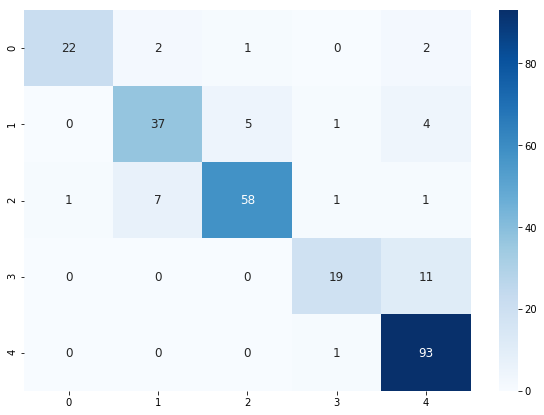

In [273]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(smooth_test), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

- This matrix is just to show that if we join the closest class to consider acceptable, we have a decent diagonal. But still and always week for the conservative.

- For the external Dataset

In [274]:
conf_ext = threshold_confusion_matrix(penta_test, pipe_NB, 'Penta_target', 0.4)


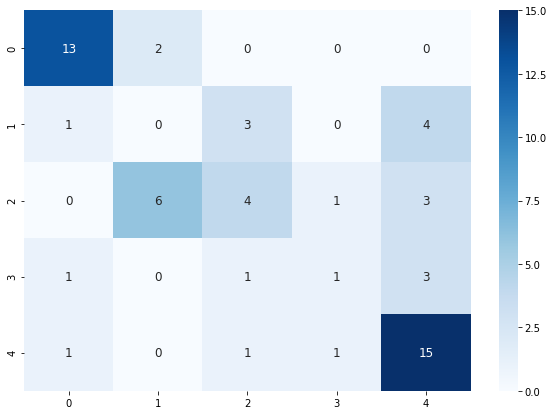

In [275]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(conf_ext), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

- Pretty strong with the extreme, very confused in the centre, with a threshold of 0.4

## ROC and AUC for the big dataset

In [276]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import scikitplot as skplt
import seaborn as sns
from matplotlib.colors import ListedColormap
cmap = ListedColormap(sns.color_palette("husl", 3))

In [277]:
probabilities_test = pipe_NB.predict_proba(X_test.textacy)


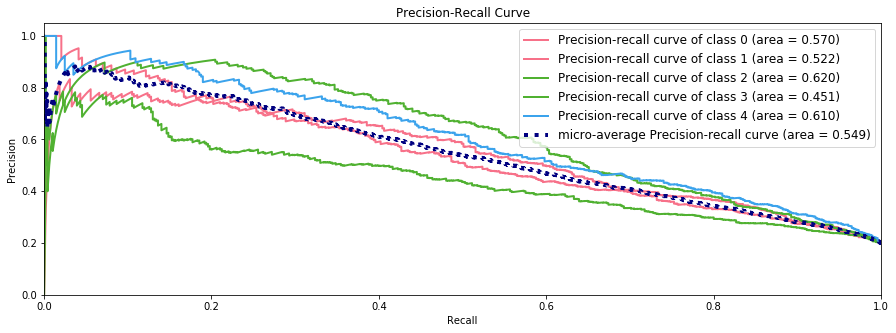

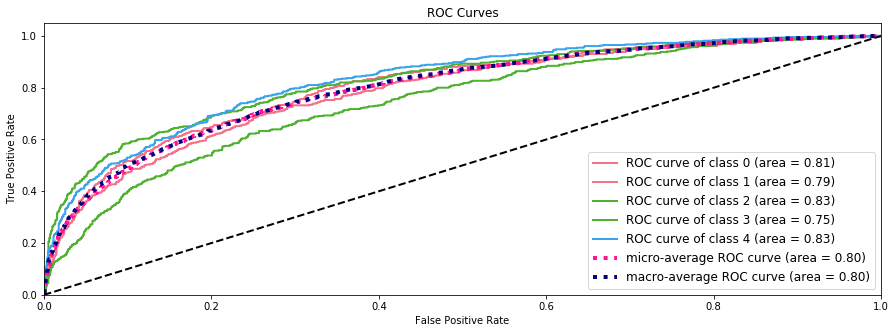

In [278]:
skplt.metrics.plot_precision_recall(y_test, probabilities_test, cmap=cmap, figsize=(15,5))
plt.legend(loc=1, prop={'size': 12})
plt.show()
skplt.metrics.plot_roc(y_test, probabilities_test, cmap=cmap, figsize=(15,5))
plt.legend(loc=4, prop={'size': 12})
plt.show()

- The PRC and the ROC shows clearly how 4 classes are pretty much balanced in the behavior, with the Left category getting better with the threshold increasing. And we see on graph what we commented almost in every model: Conservative class is bahind comparing the other classes. Overall they show a decent trend of the model.

## ROC and AUC for the external dataset

In [279]:
probabilities_extr_test = pipe_NB.predict_proba(penta_test.textacy)

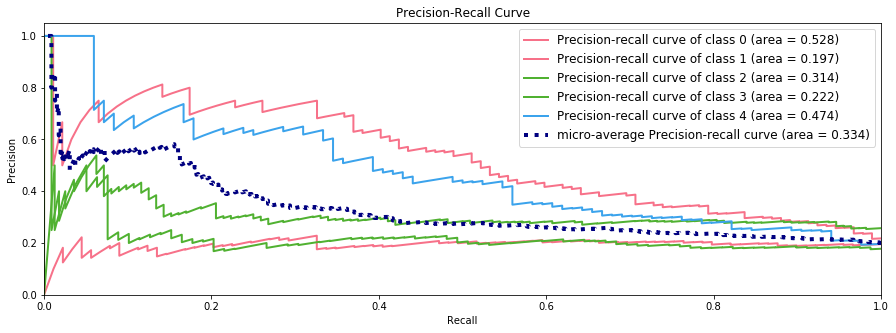

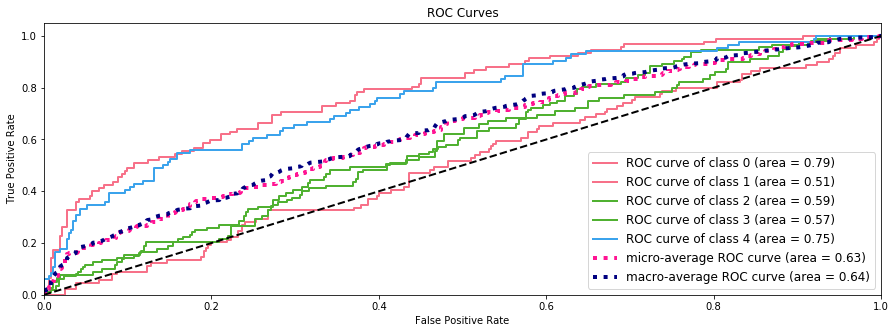

In [280]:
skplt.metrics.plot_precision_recall(penta_test.Penta_target, probabilities_extr_test, cmap=cmap, figsize=(15,5))
plt.legend(loc=1, prop={'size': 12})
plt.show()
skplt.metrics.plot_roc(penta_test.Penta_target, probabilities_extr_test, cmap=cmap, figsize=(15,5))
plt.legend(loc=4, prop={'size': 12})
plt.show()

- For the external dataset, as we notice, we have the extreme that perform almost like in the big dataset, but the other three fall almost on the baseline. Especially in the PRC they have a trend almost like a costant.

# Voting Classifier

<a id='voting'></a>

Since any model created so far have a decent behavior, but any model is different, I choose to use a Voting Classifier model to have an avarage result.

In [281]:
from sklearn.ensemble import VotingClassifier

### Soft Voting

In [283]:
vot_cl_soft = VotingClassifier(estimators=[('logic_bag', logic_bag), 
                                           ('multi_nb', multi_nb), 
                                           ('log_tfi', log_tfi), 
                                           ('pipe_NB', pipe_NB)],
                               voting='soft')


In [285]:
vot_cl_soft.fit(X_train.textacy, y_train)
vot_cl_soft.score(X_test.textacy, y_test)

0.5185643564356436

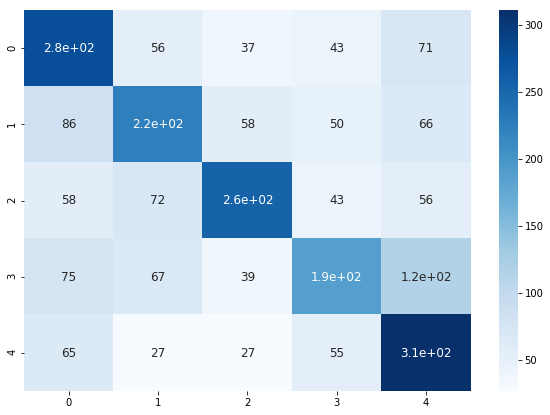

In [286]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_test, vot_cl_soft.predict(X_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [291]:
print(classification_report(y_test, vot_cl_soft.predict(X_test.textacy)))

              precision    recall  f1-score   support

           0       0.49      0.57      0.53       485
           1       0.50      0.46      0.48       485
           2       0.61      0.53      0.57       484
           3       0.50      0.39      0.44       485
           4       0.50      0.64      0.56       485

   micro avg       0.52      0.52      0.52      2424
   macro avg       0.52      0.52      0.52      2424
weighted avg       0.52      0.52      0.52      2424



**Threshold Matrix**

In [353]:
vot_conf = threshold_confusion_matrix(X_test, vot_cl_soft, 'Penta_target', 0.7)

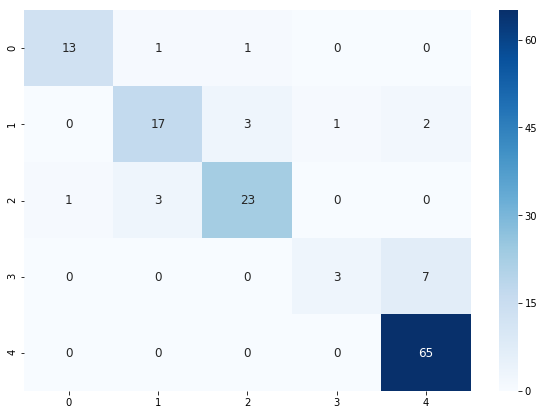

In [354]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(vot_conf), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

### Hard Voting

In [287]:
vot_cl_hard = VotingClassifier(estimators=[('logic_bag', logic_bag), 
                                           ('multi_nb', multi_nb), 
                                           ('log_tfi', log_tfi), 
                                           ('pipe_NB', pipe_NB)],
                               voting='hard')


In [288]:
vot_cl_hard.fit(X_train.textacy, y_train)
vot_cl_hard.score(X_test.textacy, y_test)

0.5111386138613861

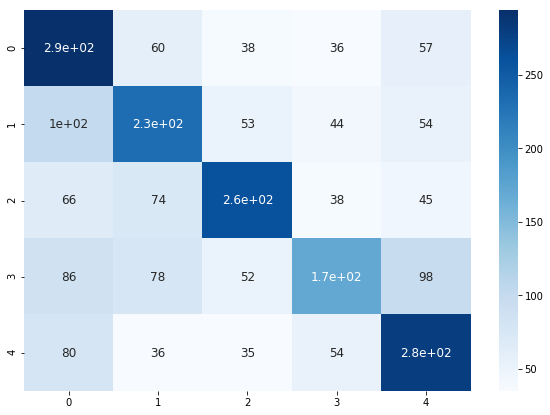

In [289]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_test, vot_cl_hard.predict(X_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [292]:
print(classification_report(y_test, vot_cl_hard.predict(X_test.textacy)))

              precision    recall  f1-score   support

           0       0.47      0.61      0.53       485
           1       0.48      0.48      0.48       485
           2       0.59      0.54      0.57       484
           3       0.50      0.35      0.41       485
           4       0.52      0.58      0.55       485

   micro avg       0.51      0.51      0.51      2424
   macro avg       0.51      0.51      0.51      2424
weighted avg       0.51      0.51      0.51      2424



On the big dataset the behavior of the machine, overall stays stable and in line with the best model. 

### External Dataset


### Soft Voting

In [290]:
vot_cl_soft.score(penta_test.textacy, penta_test.Penta_target)

0.3442982456140351

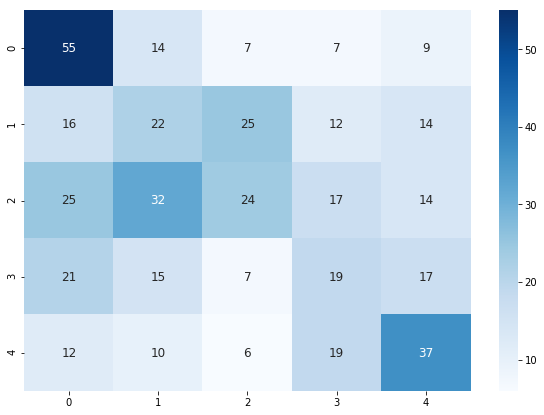

In [293]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(penta_test.Penta_target, vot_cl_soft.predict(penta_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [298]:
print(classification_report(penta_test.Penta_target, vot_cl_soft.predict(penta_test.textacy)))

              precision    recall  f1-score   support

           0       0.43      0.60      0.50        92
           1       0.24      0.25      0.24        89
           2       0.35      0.21      0.27       112
           3       0.26      0.24      0.25        79
           4       0.41      0.44      0.42        84

   micro avg       0.34      0.34      0.34       456
   macro avg       0.33      0.35      0.34       456
weighted avg       0.34      0.34      0.33       456



In [362]:
vot_sof = threshold_confusion_matrix(penta_test, vot_cl_soft, 'Penta_target', 0.6)

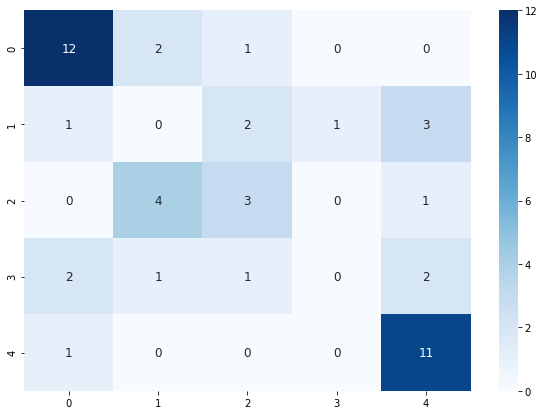

In [364]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(vot_sof), annot = True, annot_kws={"size" :12}, cmap ='Blues')

### Hard Voting

In [296]:
vot_cl_hard.score(penta_test.textacy, penta_test.Penta_target)

0.31798245614035087

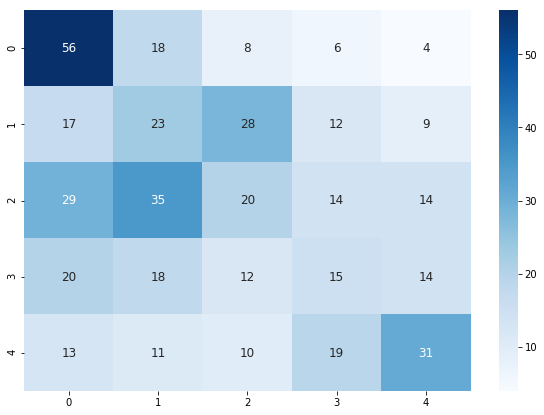

In [297]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(penta_test.Penta_target, vot_cl_hard.predict(penta_test.textacy))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [299]:
print(classification_report(penta_test.Penta_target, vot_cl_hard.predict(penta_test.textacy)))

              precision    recall  f1-score   support

           0       0.41      0.61      0.49        92
           1       0.22      0.26      0.24        89
           2       0.26      0.18      0.21       112
           3       0.23      0.19      0.21        79
           4       0.43      0.37      0.40        84

   micro avg       0.32      0.32      0.32       456
   macro avg       0.31      0.32      0.31       456
weighted avg       0.31      0.32      0.31       456



On the external Dataset, we see a decent improvement on the voting method. The hard voting didn't bring any improvement.

In [337]:
vot_cl_soft.predict_proba(penta_test.textacy)[:10]

array([[0.20124598, 0.10056195, 0.09685748, 0.14943573, 0.45189885],
       [0.1727388 , 0.30299444, 0.32241161, 0.08607329, 0.11578186],
       [0.06786497, 0.20560897, 0.17598257, 0.46169808, 0.08884542],
       [0.16752861, 0.20313719, 0.17277626, 0.29693803, 0.15961989],
       [0.31454398, 0.09588011, 0.15687614, 0.2857537 , 0.14694607],
       [0.13519719, 0.50725631, 0.17126407, 0.10623164, 0.08005079],
       [0.10143389, 0.47675008, 0.16824103, 0.14213524, 0.11143976],
       [0.43490699, 0.10409902, 0.09106422, 0.28477904, 0.08515072],
       [0.36589611, 0.10892219, 0.39093446, 0.06414677, 0.07010046],
       [0.52443358, 0.15497464, 0.05671463, 0.13174601, 0.13213113]])

# PS: Attempts to improve the model with different tecnique

## Vader and sentiment analysis

<a id='vader'></a>

- Since in politics many times we describe an ideology talking about others ideology, should be important try to see if it is possible made the model understand the sentiment of the quote. Using Vader sentiment analysis and the four component scores it creates for each sentence in the predictors

In [300]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction import DictVectorizer
from scipy.sparse import hstack
import scipy


In [301]:
analyzer = SentimentIntensityAnalyzer()

In [302]:
vader_scores = penta_train['textacy'].map(analyzer.polarity_scores)
vader_scores_tes = penta_test['textacy'].map(analyzer.polarity_scores)

In [303]:
vader_scores.head()

588      {'neg': 0.038, 'neu': 0.551, 'pos': 0.411, 'compound': 0.9851}
2605     {'neg': 0.097, 'neu': 0.775, 'pos': 0.127, 'compound': 0.6327}
1979      {'neg': 0.094, 'neu': 0.691, 'pos': 0.214, 'compound': 0.493}
775      {'neg': 0.086, 'neu': 0.85, 'pos': 0.064, 'compound': -0.4401}
67      {'neg': 0.173, 'neu': 0.731, 'pos': 0.096, 'compound': -0.3182}
Name: textacy, dtype: object

In [304]:
dvec = DictVectorizer()

vader_scores = dvec.fit_transform(vader_scores)
vader_scores_tes = dvec.fit_transform(vader_scores_tes)

In [305]:
for i, col in enumerate(dvec.feature_names_):
    penta_train['vader_{}'.format(col)] = vader_scores[:, i].toarray().ravel()
    penta_test['vader_{}'.format(col)] = vader_scores_tes[:,i].toarray().ravel()

In [306]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1,3))

In [307]:
X_tfidf = tfidf_vectorizer.fit_transform(penta_train['textacy']).todense()

In [308]:
#For the test dataset
tes_tfidf = tfidf_vectorizer.transform(penta_test['textacy']).todense()

In [309]:
sent = penta_train[['vader_neg', 'vader_pos', 'vader_neu', 'vader_compound']]
sent_tes = penta_test[['vader_neg', 'vader_pos', 'vader_neu', 'vader_compound']]

In [310]:
sent.reset_index(inplace=True)
sent_tes.reset_index(inplace=True)

In [311]:
spare_sent = scipy.sparse.csr_matrix(sent.values)
spare_sent_tes = scipy.sparse.csr_matrix(sent_tes.values)

In [312]:
#Creating the sparse matrix joining the sparse matrix of the bag of words with the vader sparse
Pred = hstack((X_tfidf, spare_sent))

In [313]:
#Sparse matrix for the test
Pred_2 = hstack((tes_tfidf, spare_sent_tes))

In [314]:
X_s_tr, X_s_ts, y_s_tr, y_s_ts = train_test_split(Pred,penta_train.Penta_target, 
                                          stratify=penta_train.Penta_target, 
                                          test_size=0.3, random_state=1 )


In [315]:
vad = LogisticRegression()

In [316]:
vad.fit(X_s_tr, y_s_tr)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [317]:
vad.score(X_s_ts, y_s_ts)

0.37376237623762376

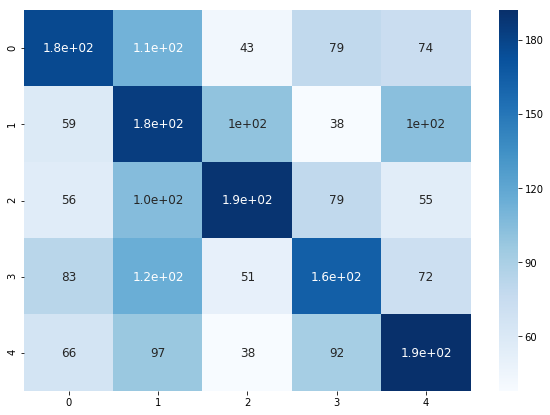

In [318]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_s_ts, vad.predict(X_s_ts))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [319]:
print(classification_report(y_s_ts, vad.predict(X_s_ts)))

              precision    recall  f1-score   support

           0       0.40      0.36      0.38       485
           1       0.30      0.38      0.34       485
           2       0.45      0.39      0.42       484
           3       0.36      0.34      0.35       485
           4       0.39      0.40      0.39       485

   micro avg       0.37      0.37      0.37      2424
   macro avg       0.38      0.37      0.38      2424
weighted avg       0.38      0.37      0.38      2424



- The main difference with the others model is large number of false positive in the Progressive class. Conservative have a slightly improvement, but the Right class, that was one of our best category has a consistent drop. Overall the model perform worst than before.

- For the external Dataset

In [320]:
vad.score(Pred_2,penta_test.Penta_target)

0.2324561403508772

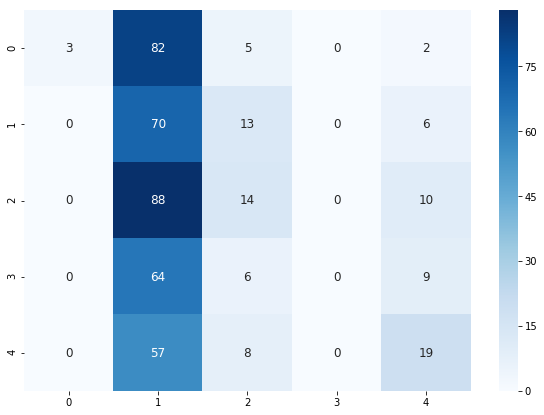

In [321]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(penta_test.Penta_target, vad.predict(Pred_2))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [322]:
print(classification_report(penta_test.Penta_target, vad.predict(Pred_2)))

              precision    recall  f1-score   support

           0       1.00      0.03      0.06        92
           1       0.19      0.79      0.31        89
           2       0.30      0.12      0.18       112
           3       0.00      0.00      0.00        79
           4       0.41      0.23      0.29        84

   micro avg       0.23      0.23      0.23       456
   macro avg       0.38      0.23      0.17       456
weighted avg       0.39      0.23      0.17       456



- Very weirdly in the external dataset the model with sentiment analysis doesn't predict any Left or Conservative. As in the big dataset there is an enormous amount of false positive in the Progressive, creating a very low 18% of precision and a very high 71% of recall. Basically is a model who predict mostly the Progressive class, dropping the score around the baseline.

- Sentiment Analysis could be an useful weapon, but not in this case. It should require more investigation and attempts to understand if it could be useful in an ideology detection problem

## Word2Vec

<a id='word2vec'></a>

- The last attempt I did was to use the Neural Network tool Word2Vec, which use a pre-trained corpus to describe each word with a vector of 300 dimensions. It is a tool used especially where the semantic part of the sentence is important in the contest of a bigger corpus. In a database like this one that contains noise in the word and in the lenght of the sentence, it is not sure its behavior.

In [325]:
import gensim

In [326]:
word2vec_path = "GoogleNews-vectors-negative300.bin.gz"
word2vec = gensim.models.KeyedVectors.load_word2vec_format(word2vec_path, binary=True)

In [327]:
def get_average_word2vec(tokens_list, vector, generate_missing=False, k=300):
    if len(tokens_list)<1:
        return np.zeros(k)
    if generate_missing:
        vectorized = [vector[word] if word in vector else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word] if word in vector else np.zeros(k) for word in tokens_list]
    length = len(vectorized)
    summed = np.sum(vectorized, axis=0)
    averaged = np.divide(summed, length)
    return averaged

def get_word2vec_embeddings(vectors, df, generate_missing=False):
    embeddings = df['tokens'].apply(lambda x: get_average_word2vec(x, vectors, 
                                                                                generate_missing=generate_missing))
    return list(embeddings)

In [328]:
embeddings = get_word2vec_embeddings(word2vec, penta_train)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(embeddings, 
                                                                                        penta_train.Penta_target,
                                                                                        stratify=penta_train.Penta_target,
                                                                                        test_size=0.3, random_state=40)

In [329]:
test_embedding = (get_word2vec_embeddings(word2vec, penta_test))

In [330]:
c = LogisticRegression()
c.fit(X_train_word2vec, y_train_word2vec)
c.score(X_test_word2vec, y_test_word2vec)

0.42533003300330036

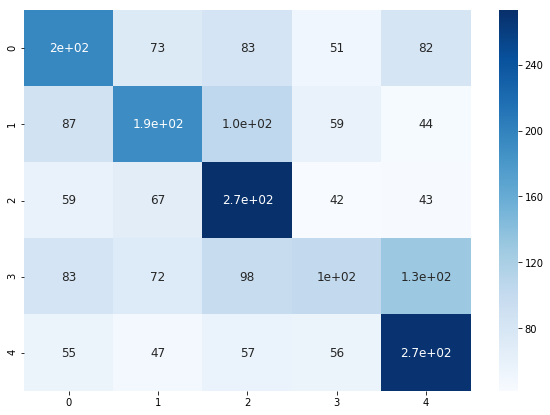

In [331]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(y_test_word2vec, c.predict(X_test_word2vec))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [332]:
print(classification_report(y_test_word2vec, c.predict(X_test_word2vec)))

              precision    recall  f1-score   support

           0       0.41      0.40      0.41       485
           1       0.42      0.39      0.41       485
           2       0.44      0.56      0.50       484
           3       0.33      0.21      0.26       485
           4       0.47      0.56      0.51       485

   micro avg       0.43      0.43      0.43      2424
   macro avg       0.42      0.43      0.42      2424
weighted avg       0.42      0.43      0.42      2424



- It seems that Word2Vec didn't bring any help in the understanding of the classes. 

In [333]:
c.score(test_embedding, penta_test.Penta_target)

0.3333333333333333

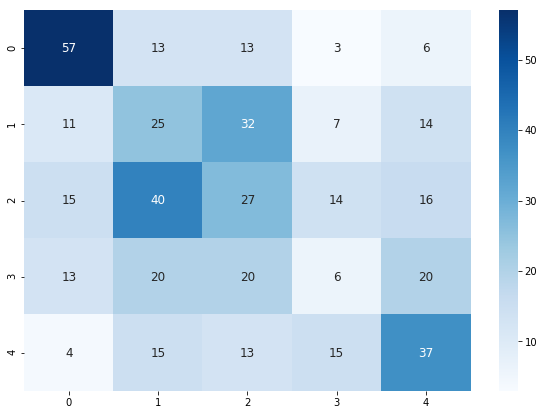

In [334]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.DataFrame(confusion_matrix(penta_test.Penta_target, c.predict(test_embedding))), 
            annot=True,annot_kws={"size": 12}, cmap="Blues")

In [335]:
print(classification_report(penta_test.Penta_target, c.predict(test_embedding)))

              precision    recall  f1-score   support

           0       0.57      0.62      0.59        92
           1       0.22      0.28      0.25        89
           2       0.26      0.24      0.25       112
           3       0.13      0.08      0.10        79
           4       0.40      0.44      0.42        84

   micro avg       0.33      0.33      0.33       456
   macro avg       0.32      0.33      0.32       456
weighted avg       0.32      0.33      0.32       456



- The score is probably the best one in the external dataset, but most of the it comes from the Left, which has an balance Precision-Recall. In the centre great confusion. And decent on the right